## 1. [ALIBI DETECT](#ALIBI-DETECT-(TESTING))
## 2. [VAE](#VAE)
### 2.1 [VAE ARCHITECTURE](#VAE-ARCHITECTURE)
### 2.1.1 [NON LATENT VAE](#NON-LATENT-VAE)
### 2.1.2 [LATENT VAE](#LATENT-VAE)
### 2.2 [DISPLAY FUNCTION](#DISPLAY-FUNCTION)
### 2.3 [DATA](#DATA)
#### 2.3.1 [INLIERS](#INLIERS)
#### 2.3.2 [OUTLIERS](#OUTLIERS)
### 2.4 [TRAINING](#TRAINING)
#### 2.4.1 [TRAINING FUNCTION](#TRAINING-FUNCTION)
#### 2.4.2 [RUN TRAINING](#RUN-TRAINING)
#### 2.4.3 [LOAD MODEL](#LOAD-MODEL)
#### 2.4.4 [SAMPLE RECONSTRUCTION](#SAMPLE-RECONSTRUCTION)
#### 2.4.5 [SAMPLE INFERENCE](#SAMPLE-INFERENCE)
## 3. [INTEGRATION WITH YOLO](#INTEGRATION-WITH-YOLO)
### 3.1 [TRAIN YOLO](#TRAIN-YOLO)
### 3.2 [SAVE LATENT TENSORS](#SAVE-LATENT-TENSORS)
### 3.3 [CREATE LATENT TENSOR DATALOADERS](#LATENT-TENSOR-DATALOADERS)
### 3.4 [SAVE ANAMOLIES](#SAVE-ANAMOLIES)
### 3.5 [TRAIN VAE WITH LATENT TENSORS](#TRAIN-VAE-WITH-LATENT-TENSORS)


## ALIBI-DETECT (TESTING)

In [ ]:
import os
import logging
import tensorflow as tf
tf.keras.backend.clear_session()
TF_ENABLE_ONEDNN_OPTS=0
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, \
    Dense, Layer, Reshape, InputLayer, Flatten
from tqdm import tqdm
from alibi_detect.od import OutlierAE
from alibi_detect.utils.fetching import fetch_detector
from alibi_detect.utils.perturbation import apply_mask
from alibi_detect.saving import save_detector, load_detector
from alibi_detect.utils.visualize import plot_instance_score, plot_feature_outlier_image

import matplotlib.pyplot as plt
import numpy as np

In [ ]:
train, test = tf.keras.datasets.cifar10.load_data()
X_train, y_train = train
X_test, y_test = test

X_train = X_train.astype('float32') / 255
X_test = X_test.astype('float32') / 255
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

In [ ]:
len(X_train)

In [ ]:
X_train.shape

In [ ]:
height, width = 224, 224

def preprocess_image(file_path):
    image = tf.io.read_file(file_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [height, width], method = 'bicubic')
    image = image/255.0

    return image


fk_train_folder = '/nfs/home/sidsom/Forklifts/train'
fk_train_files = [os.path.join(fk_train_folder, file) for file in os.listdir(fk_train_folder) if file.endswith('.jpg')]

fk_val_folder = '/nfs/home/sidsom/Forklifts/valid'
fk_val_files = [os.path.join(fk_val_folder, file) for file in os.listdir(fk_val_folder) if file.endswith('.jpg')]


train_dataset = tf.data.Dataset.from_tensor_slices(fk_train_files)
train_dataset = train_dataset.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
train_array = np.array(list(train_dataset.as_numpy_iterator()))


val_dataset = tf.data.Dataset.from_tensor_slices(fk_val_files)
val_dataset = val_dataset.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
val_array = np.array(list(val_dataset.as_numpy_iterator()))

In [ ]:
train_array[8].shape

In [ ]:
filepath = '/nfs/home/sidsom'
detector_type = 'outlier'
dataset = 'Forklifts'
detector_name = 'OutlierAE'
filepath = os.path.join(filepath, detector_name)
load_outlier_detector = False

In [ ]:
#gpu_options = tf.compat.v1.GPUOptions(set_per_process_memory_fraction(0.333))
#sess = tf.Session(config=tf.compat.v1.ConfigProto(gpu_options=gpu_options))
encoding_dim =  1024

encoder_net = tf.keras.Sequential(
    [
        InputLayer(input_shape = (32, 32, 3)),
        Conv2D(64, 4, strides = 2, padding='same', activation=tf.nn.relu),
        Conv2D(128, 4, strides = 2, padding='same', activation=tf.nn.relu),
        Conv2D(512, 4, strides = 2, padding='same', activation=tf.nn.relu),
        Flatten(),
        Dense(encoding_dim,)
    ]
)

decoder_net = tf.keras.Sequential(
    [
      InputLayer(input_shape=(encoding_dim,)),
      Dense(4*4*128),
      Reshape(target_shape=(4, 4, 128)),
      Conv2DTranspose(256, 4, strides=2, padding='same', activation=tf.nn.relu),
      Conv2DTranspose(64, 4, strides=2, padding='same', activation=tf.nn.relu),
      Conv2DTranspose(3, 4, strides=2, padding='same', activation='sigmoid')
    ]
)

In [ ]:
od = OutlierAE(threshold=.015,  # threshold for outlier score
                    encoder_net=encoder_net,  # can also pass AE model instead
                    decoder_net=decoder_net,  # of separate encoder and decoder
                    )
    # train
tf.keras.backend.clear_session()
od.fit(train_array,
       epochs=20, batch_size = 8, 
       verbose=True)

# save the trained outlier detector
save_detector(od, filepath)

In [ ]:
idx = 8
X = train_array[idx].reshape(1, 224, 224, 3)
X_recon = od.ae(X)

In [ ]:
plt.imshow(train_array[150])
plt.axis('off')
plt.show()

In [ ]:
plt.imshow(X.reshape(32, 32, 3))
plt.axis('off')
plt.show()

In [ ]:
plt.imshow(X_recon.numpy().reshape(32, 32, 3))
plt.axis('off')
plt.show()

In [ ]:
X = train_array[:500]
print(X.shape)

In [ ]:
od_preds = od.predict(X,
                      outlier_type='instance',    # use 'feature' or 'instance' level
                      return_feature_score=True,  # scores used to determine outliers
                      return_instance_score=True)
print(list(od_preds['data'].keys()))

In [ ]:
target = np.zeros(X.shape[0],).astype(int)  # all normal CIFAR10 training instances
labels = ['normal', 'outlier']
plot_instance_score(od_preds, target, labels, od.threshold)

In [ ]:
X_recon = od.ae(X).numpy()
plot_feature_outlier_image(od_preds,
                           X,
                           X_recon=X_recon,
                           instance_ids=[8, 60, 100, 330],  # pass a list with indices of instances to display
                           max_instances=5,  # max nb of instances to display
                           outliers_only=False) 

In [ ]:
import time
start = time.time()
od_preds = od.predict(val_array[:200],
                        outlier_type='instance',    # use 'feature' or 'instance' level
                        return_feature_score=True,  # scores used to determine outliers
                        return_instance_score=True)

end = time.time()

print('Time taken per prediction is: ', (end-start)/200)

## VAE

In [125]:
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torchvision.models import detection
from torch.optim.lr_scheduler import StepLR
from torchsummary import summary
import os
import json
import numpy as np
from itertools import chain, islice
from PIL import Image
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import pandas as pd
import shutil
from ultralyticsplus import YOLO, render_result
from PIL import Image, ImageEnhance
import random 
%matplotlib inline
from IPython.display import display
from torchvision.transforms.functional import rotate

### VAE ARCHITECTURE 

#### NON LATENT VAE

In [276]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ResidualBlock, self).__init__()

        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False)
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        out = self.block(x)
        out += x
        out = self.relu(out)
        return out



class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(EncoderBlock, self).__init__()
        self.block = nn.Sequential(
                    nn.Conv2d(in_channels, out_channels,
                              kernel_size = 3, stride = 2, padding = 1),
                    nn.LeakyReLU(),
                    nn.Conv2d(out_channels, out_channels,
                              kernel_size = 3, stride = 1, padding = 1),
                    nn.BatchNorm2d(out_channels),
                    nn.LeakyReLU()
        )
        self.resblock = ResidualBlock(out_channels, out_channels)
    def forward(self, x):
        x = self.block(x)
        x = self.resblock(x)
        return x
        
class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DecoderBlock, self).__init__()
        self.block = nn.Sequential(
                            nn.ConvTranspose2d(in_channels,
                                               out_channels,
                                               kernel_size = 3,
                                               stride = 2,
                                               padding=1,
                                               output_padding=1),
                            nn.LeakyReLU(),
                            nn.Conv2d(out_channels, out_channels,
                                      kernel_size = 3, stride = 1, padding = 1),
                            nn.BatchNorm2d(out_channels),
                            nn.LeakyReLU()
        )
        
        self.resblock = ResidualBlock(out_channels, out_channels)

    def forward(self, x):
        x = self.block(x)
        x = self.resblock(x)
        return x
        

                                
class NonLatentVanillaVAE(torch.nn.Module):
    def __init__(self,
                 in_channels = 3,
                 latent_dim = 512,
                 hidden_dims = None,
                 kld_weight = 0.0001,
                 **kwargs) -> None:
        super(NonLatentVanillaVAE, self).__init__()
        self.latent_dim = latent_dim
        self.kld_weight = kld_weight



        modules = []
        if hidden_dims is None:
            hidden_dims = [32, 64, 128, 256, 512]

        # Build Encoder
        
        for h_dim in hidden_dims:
            modules.append(EncoderBlock(in_channels, h_dim))
            in_channels = h_dim

        self.encoder = nn.Sequential(*modules)
        self.fc_mu = nn.Linear(hidden_dims[-1]*8**2, latent_dim)
        self.fc_var = nn.Linear(hidden_dims[-1]*8**2, latent_dim)


        modules = []

        self.decoder_input = nn.Linear(latent_dim, hidden_dims[-1] * 8**2)

        hidden_dims.reverse()

        #Embedding layer
        modules.append(
                nn.Sequential(
                    nn.Conv2d(hidden_dims[0], out_channels=hidden_dims[0],
                              kernel_size = 1, stride = 1, padding = 0),
                    nn.BatchNorm2d(hidden_dims[0]),
                    nn.LeakyReLU())
            )
        
        
        # Build Decoder
        for i in range(len(hidden_dims) - 1):
            modules.append(DecoderBlock(hidden_dims[i], hidden_dims[i+1]))



        self.decoder = nn.Sequential(*modules)

        self.final_layer = nn.Sequential(
                            nn.ConvTranspose2d(hidden_dims[-1],
                                               hidden_dims[-1],
                                               kernel_size=3,
                                               stride=2,
                                               padding=1,
                                               output_padding=1),
                            nn.BatchNorm2d(hidden_dims[-1]),
                            nn.LeakyReLU(),
                            nn.Conv2d(hidden_dims[-1], out_channels = 3, kernel_size= 3, padding= 1))

    def encode(self, input):
        """
        Encodes the input by passing through the encoder network
        and returns the latent codes.
        :param input: (Tensor) Input tensor to encoder [N x C x H x W]
        :return: (Tensor) List of latent codes
        """

        result = self.encoder(input)
        result = torch.flatten(result, start_dim=1)
        # Split the result into mu and var components
        # of the latent Gaussian distribution
        mu = self.fc_mu(result)
        log_var = self.fc_var(result)

        return [mu, log_var]

    def decode(self, z):
            """
            Maps the given latent codes
            onto the image space.
            :param z: (Tensor) [B x D]
            :return: (Tensor) [B x C x H x W]
            
            """
   
            result = self.decoder_input(z)
            result = result.view(-1, self.latent_dim, 8, 8)
            result = self.decoder(result)
            result = self.final_layer(result)

            return result
    def reparameterize(self, mu, logvar):
        """
        Reparameterization trick to sample from N(mu, var) from
        N(0,1).
        :param mu: (Tensor) Mean of the latent Gaussian [B x D]
        :param logvar: (Tensor) Standard deviation of the latent Gaussian [B x D]
        :return: (Tensor) [B x D]
        """
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return eps * std + mu 

    def forward(self, input, **kwargs):
        """
        Passes the input through the whole network. 
        Pray to God before running this.
        :param input: (Tensor) Input tensor [N x C x H x W]
        :param kwargs
        :return: (Tensor) List of tensors
        
        """
        mu, log_var = self.encode(input)
        z = self.reparameterize(mu, log_var)
        z = self.decode(z)
        
        return  [z, input, mu, log_var]

    def loss_function(self,
                      *args,
                      **kwargs) -> dict:
        """
        Computes the VAE loss function.
        KL(N(\mu, \sigma), N(0, 1)) = \log \frac{1}{\sigma} + \frac{\sigma^2 + \mu^2}{2} - \frac{1}{2}
        :param args:
        :param kwargs:
        :return: (Dict) Dictionary of losses
        """
        recons = args[0]
        input = args[1]
        mu = args[2]
        log_var = args[3]

         #kwargs['M_N'] # Account for the minibatch samples from the dataset
        recons_loss = nn.functional.mse_loss(recons, input)
        l1_loss = nn.functional.l1_loss(recons, input)


        kld_loss = torch.mean(-0.5 * torch.sum(1 + log_var - mu ** 2 - log_var.exp(), dim = 1), dim = 0)

        loss = recons_loss + self.kld_weight * kld_loss + 0.1*l1_loss
        return {'loss': loss, 'MSE':recons_loss.detach(), 'KLD':-kld_loss.detach(), 'L1':l1_loss.detach()}

    def sample(self,
               num_samples:int,
               current_device: int, **kwargs):
        """
        Samples from the latent space and return the corresponding
        image space map.
        :param num_samples: (Int) Number of samples
        :param current_device: (Int) Device to run the model
        :return: (Tensor)
        """
        z = torch.randn(num_samples,
                        self.latent_dim)

        z = z.to(current_device)

        samples = self.decode(z)
        return samples

    def generate(self, x, **kwargs):
        """
        Given an input image x, returns the reconstructed image
        :param x: (Tensor) [B x C x H x W]
        :return: (Tensor) [B x C x H x W]
        """

        return self.forward(x)[0]

    def anamoly_detection(self, image, **kwargs):
        """
        Returns loss dictionary of given input
        :param image: (Tensor) [C x H x W]
        :return: (Dict) Dictionary of loss values
        """
        image = image.to(device)
        self.eval()
        with torch.no_grad():
            recon, image, mu, logvar = self(image)
            metrics = self.loss_function(recon, image, mu, logvar)
            return metrics
    def check_if_outlier(self, image, threshold, **kwargs):
        """
        Checks if a given input is an outlier or not based on its reconstruction loss.
        :param image: (Tensor) [B x C x H x W]
        :param threshold: (Float) threshold against which loss is compared
        :return: (Bool) True if input is an outlier 
        """
        metrics = self.anamoly_detection(image, **kwargs)
        return (metrics['loss'] > threshold)

#### LATENT VAE

In [402]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ResidualBlock, self).__init__()

        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False)
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        out = self.block(x)
        out += x
        out = self.relu(out)
        return out



class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(EncoderBlock, self).__init__()
        self.block = nn.Sequential(
                    nn.Conv2d(in_channels, out_channels,
                              kernel_size = 3, stride = 2, padding = 1),
                    nn.LeakyReLU(),
                    nn.Conv2d(out_channels, out_channels,
                              kernel_size = 3, stride = 1, padding = 1),
                    nn.BatchNorm2d(out_channels),
                    nn.LeakyReLU()
        )
        self.resblock = ResidualBlock(out_channels, out_channels)
    def forward(self, x):
        x = self.block(x)
        x = self.resblock(x)
        return x
        
class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DecoderBlock, self).__init__()
        self.block = nn.Sequential(
                            nn.ConvTranspose2d(in_channels,
                                               out_channels,
                                               kernel_size = 3,
                                               stride = 2,
                                               padding=1,
                                               output_padding=1),
                            nn.LeakyReLU(),
                            nn.Conv2d(out_channels, out_channels,
                                      kernel_size = 3, stride = 1, padding = 1),
                            nn.BatchNorm2d(out_channels),
                            nn.LeakyReLU()
        )
        
        self.resblock = ResidualBlock(out_channels, out_channels)

    def forward(self, x):
        x = self.block(x)
        x = self.resblock(x)
        return x
        

                                
class LatentVanillaVAE(torch.nn.Module):
    def __init__(self,
                 in_channels = 256,
                 latent_dim = 1024,
                 latent_size = 5,
                 hidden_dims = None,
                 kld_weight = 0.0001,
                 **kwargs) -> None:
        super(LatentVanillaVAE, self).__init__()
        self.latent_dim = latent_dim
        self.kld_weight = kld_weight
        self.latent_size = latent_size


        modules = []
        if hidden_dims is None:
            hidden_dims = [512, 1024]

        # Build Encoder
        
        for h_dim in hidden_dims:
            modules.append(EncoderBlock(in_channels, h_dim))
            in_channels = h_dim

        self.encoder = nn.Sequential(*modules)
        self.fc_mu = nn.Linear(hidden_dims[-1]*self.latent_size*self.latent_size, latent_dim)
        self.fc_var = nn.Linear(hidden_dims[-1]*self.latent_size*self.latent_size, latent_dim)


        modules = []

        self.decoder_input = nn.Linear(latent_dim, hidden_dims[-1] * self.latent_size * self.latent_size)

        hidden_dims.reverse()

        #Embedding layer
        modules.append(
                nn.Sequential(
                    nn.Conv2d(hidden_dims[0], out_channels=hidden_dims[0],
                              kernel_size = 1, stride = 1, padding = 0),
                    nn.BatchNorm2d(hidden_dims[0]),
                    nn.LeakyReLU())
            )
        
        
        # Build Decoder
        for i in range(len(hidden_dims) - 1):
            modules.append(DecoderBlock(hidden_dims[i], hidden_dims[i+1]))



        self.decoder = nn.Sequential(*modules)

        self.final_layer = nn.Sequential(
                            nn.ConvTranspose2d(hidden_dims[-1],
                                               hidden_dims[-1],
                                               kernel_size=3,
                                               stride=2,
                                               padding=1,
                                               output_padding=1),
                            nn.BatchNorm2d(hidden_dims[-1]),
                            nn.LeakyReLU(),
                            nn.Conv2d(hidden_dims[-1], out_channels = 256, kernel_size= 3, padding= 1))

    def encode(self, input):
        """
        Encodes the input by passing through the encoder network
        and returns the latent codes.
        :param input: (Tensor) Input tensor to encoder [N x C x H x W]
        :return: (Tensor) List of latent codes
        """

        result = self.encoder(input)
        result = torch.flatten(result, start_dim=1)
        # Split the result into mu and var components
        # of the latent Gaussian distribution
        mu = self.fc_mu(result)
        log_var = self.fc_var(result)

        return [mu, log_var]

    def decode(self, z):
        """
        Maps the given latent codes
        onto the image space.
        :param z: (Tensor) [B x D]
        :return: (Tensor) [B x C x H x W]
        
        """
   
        result = self.decoder_input(z)
        result = result.view(-1, self.latent_dim, self.latent_size, self.latent_size)
        result = self.decoder(result)
        result = self.final_layer(result)

        return result
    def reparameterize(self, mu, logvar):
        """
        Reparameterization trick to sample from N(mu, var) from
        N(0,1).
        :param mu: (Tensor) Mean of the latent Gaussian [B x D]
        :param logvar: (Tensor) Standard deviation of the latent Gaussian [B x D]
        :return: (Tensor) [B x D]
        """
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return eps * std + mu 

    def forward(self, input, **kwargs):
        """
        Passes the input through the whole network. 
        Pray to God before running this.
        :param input: (Tensor) Input tensor [N x C x H x W]
        :param kwargs
        :return: (Tensor) List of tensors
        
        """
        mu, log_var = self.encode(input)
        z = self.reparameterize(mu, log_var)
        z = self.decode(z)
        
        return  [z, input, mu, log_var]

    def loss_function(self,
                      *args,
                      **kwargs) -> dict:
        """
        Computes the VAE loss function.
        KL(N(\mu, \sigma), N(0, 1)) = \log \frac{1}{\sigma} + \frac{\sigma^2 + \mu^2}{2} - \frac{1}{2}
        :param args:
        :param kwargs:
        :return: (Dict) Dictionary of losses
        """
        recons = args[0]
        input = args[1]
        mu = args[2]
        log_var = args[3]

         #kwargs['M_N'] # Account for the minibatch samples from the dataset
        recons_loss = nn.functional.mse_loss(recons, input)
        l1_loss = nn.functional.l1_loss(recons, input)


        kld_loss = torch.mean(-0.5 * torch.sum(1 + log_var - mu ** 2 - log_var.exp(), dim = 1), dim = 0)

        loss = recons_loss + self.kld_weight * kld_loss + 0.1*l1_loss
        return {'loss': loss, 'MSE':recons_loss.detach(), 'KLD':-kld_loss.detach(), 'L1':l1_loss.detach()}

    def sample(self,
               num_samples:int,
               current_device: int, **kwargs):
        """
        Samples from the latent space and return the corresponding
        image space map.
        :param num_samples: (Int) Number of samples
        :param current_device: (Int) Device to run the model
        :return: (Tensor)
        """
        z = torch.randn(num_samples,
                        self.latent_dim)

        z = z.to(current_device)

        samples = self.decode(z)
        return samples

    def generate(self, x, **kwargs):
        """
        Given an input image x, returns the reconstructed image
        :param x: (Tensor) [B x C x H x W]
        :return: (Tensor) [B x C x H x W]
        """

        return self.forward(x)[0]

    def anamoly_detection(self, image, **kwargs):
        """
        Returns loss dictionary of given input
        :param image: (Tensor) [C x H x W]
        :return: (Dict) Dictionary of loss values
        """
        image = image.to(device)
        self.eval()
        with torch.no_grad():
            recon, image, mu, logvar = self(image)
            metrics = self.loss_function(recon, image, mu, logvar)
            return metrics
    def check_if_outlier(self, image, threshold, **kwargs):
        """
        Checks if a given input is an outlier or not based on its reconstruction loss.
        :param image: (Tensor) [B x C x H x W]
        :param threshold: (Float) threshold against which loss is compared
        :return: (Bool) True if input is an outlier 
        """
        metrics = self.anamoly_detection(image, **kwargs)
        return (metrics['loss'] > threshold)

### DISPLAY FUNCTION

In [130]:
def display_sample(images, max_render=5):
    """
    Helper function to display samples. 
    """
    images = images[:max_render] if len(images) > max_render else images
    fig, axs = plt.subplots(1, len(images), figsize = (5*len(images),5))
    if len(images) == 1:
        axs = [axs]
    for i, (ax, image) in enumerate(zip(axs, images)):
        ax.axis('off')
        #print(image.shape)
        #pil = torchvision.transforms.functional.to_pil_image(image)
        #print(pil.getextrema())
        #image = int(image*255)
        ax.imshow(image.permute(1, 2, 0).numpy())
        #ax.imshow(pil)
        #ax.imshow(image)
        
    plt.tight_layout()

    plt.show()

### DATA 

#### INLIERS 

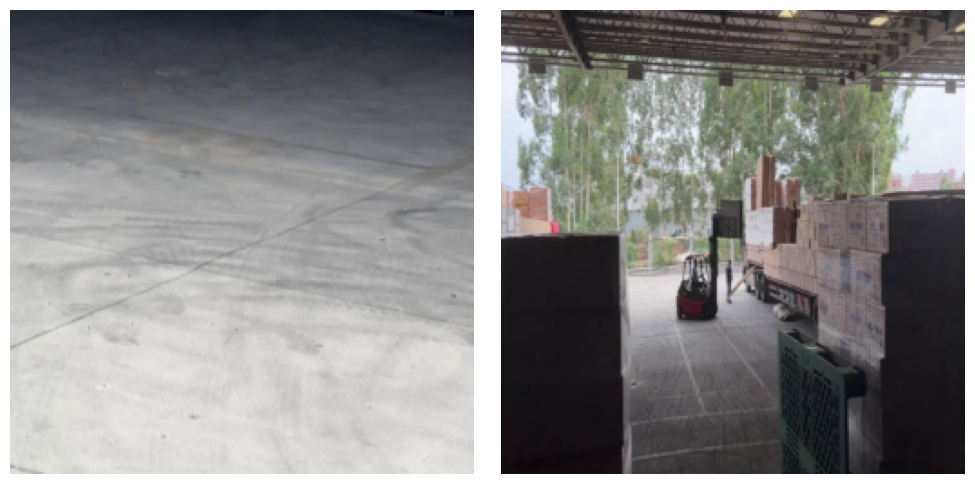

In [381]:
class Forklift(Dataset):
    def __init__(self, root_dir, transform = None):
        self.root_dir = root_dir
        self.transform = transform
        self.files = os.listdir(self.root_dir)
        self.files = [file for file in os.listdir(self.root_dir) if os.path.splitext(file)[-1].lower() == '.jpg']


    def __len__(self):
        return len(self.files)
    def __getitem__(self, idx):
        if type(idx) is list:
            return [self.__getitem__(item) for item in idx]
        image_path = os.path.join(self.root_dir, self.files[idx])
        #image_path = [image_path+'/'+ f for f in os.listdir(image_path) if os.path.splitext(f)[1]=='.jpg'].pop()
        image = Image.open(image_path).convert("RGB")
        
        if self.transform:
            image = self.transform(image)
        
        return image
transforms_rgb = transforms.Compose([
    transforms.Resize((256, 256)),  
    transforms.ToTensor()
])
dst = "datasets/yolov8_forklifts/images/train/images"
forklift_dataset = Forklift(dst, transforms_rgb)
train_dataset, test_dataset = random_split(forklift_dataset, [0.8, 0.2])
train_loader = DataLoader(train_dataset, batch_size = 2, shuffle = True)
test_loader = DataLoader(test_dataset, batch_size = 2, shuffle = True)

display_sample(next(iter(train_loader)))

#### OUTLIERS

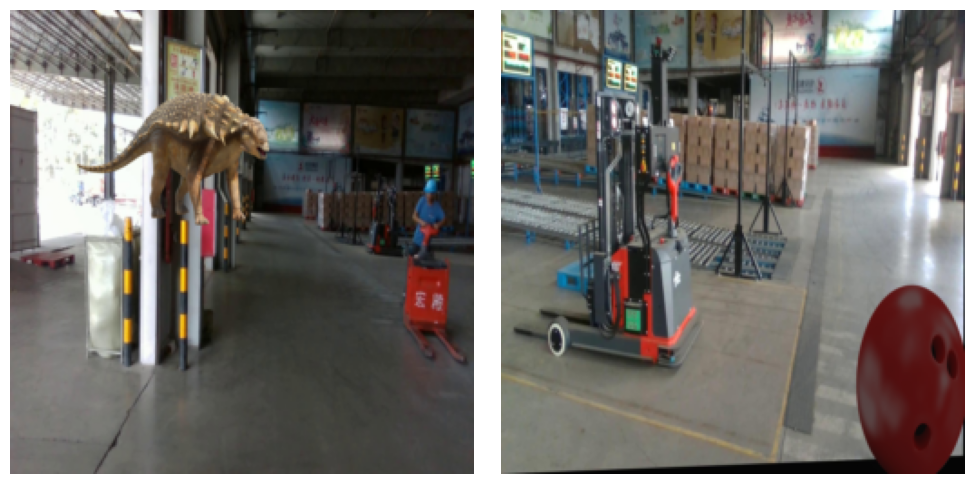

In [382]:
def apply_random_augmentations(image):
    """
    Randomly applies 4 different augmentations.
    
    :param image : RGB image
    :return image : RGB image 
    """
    # Randomly apply augmentations
    if random.choice([True, False]):
        # Flip horizontally
        image = image.transpose(Image.FLIP_LEFT_RIGHT)

    if random.choice([True, False]):
        # Rotate randomly between -30 to 30 degrees
        angle = random.randint(-30, 30)
        image = image.rotate(angle, resample=Image.BICUBIC, expand=True)

    if random.choice([True, False]):
        # Adjust brightness
        enhancer = ImageEnhance.Brightness(image)
        factor = random.uniform(0.5, 1.5)
        image = enhancer.enhance(factor)

    if random.choice([True, False]):
        # Adjust contrast
        enhancer = ImageEnhance.Contrast(image)
        factor = random.uniform(0.5, 1.5)
        image = enhancer.enhance(factor)

    return image

def paste_foreground_on_background(background_path, foreground_path):
    """
    Pastes an image onto a base image after augmenting it.
    
    :param background_path : file path
    :param foreground_path : file path
    :return background : RGB image
    """
    # Open images
    background = Image.open(background_path)
    foreground = Image.open(foreground_path)

    # Resize
    scale = 0.4+0.3*random.random()
    new_size = (int(s*scale) for s in foreground.size)
    foreground = foreground.resize(new_size, resample=Image.Resampling.LANCZOS)

    # Apply random augmentations to foreground
    augmented_foreground = apply_random_augmentations(foreground)

    # Get the alpha channel of the foreground (transparency mask)
    alpha = augmented_foreground.getchannel('A')

    # Paste the foreground onto the background, omitting the background of the foreground using the alpha mask
    b_size, f_size = (np.array(x.size) for x in [background, foreground])
    position = map(int, random.random()*(b_size-f_size))
    background.paste(augmented_foreground, (*position,), alpha)
    
    return background
    #display(background)
class Anomalies(Dataset):
    def __init__(self, root_dir, stock_dir, transform = None):
        self.root_dir = root_dir
        self.stock_dir = stock_dir
        self.transform = transform
        self.files = [file for file in os.listdir(self.root_dir) if os.path.splitext(file)[-1].lower() == '.jpg']
        self.stocks = os.listdir(self.stock_dir)

    def __len__(self):
        return len(self.files)
    def __getitem__(self, idx):
        if type(idx) is list:
            return [self.__getitem__(item) for item in idx]
        image_path = os.path.join(self.root_dir, self.files[idx])
        stock_path = os.path.join(self.stock_dir, self.stocks[random.randint(0, len(self.stocks)-1)])
        image_anomaly =  paste_foreground_on_background(image_path, stock_path)
        #display(image_anomaly)
        if self.transform:
            image_anomaly = self.transform(image_anomaly)
        
        return image_anomaly
transforms_rgb = transforms.Compose([
    transforms.Resize((256, 256)),  
    transforms.ToTensor()
])
dst = "datasets/yolov8_forklifts/images/train/images"
dst2 = "Stock images"
anomaly_dataset = Anomalies(dst, dst2, transforms_rgb)
anomaly_loader = DataLoader(anomaly_dataset, batch_size = 2, shuffle = True)
display_sample(next(iter(anomaly_loader)))

### TRAINING 

#### TRAINING FUNCTION 

In [283]:
def train_model(model, epochs, optimizer, train_loader, batch_size, save_path, max_grad_norm = 3.0):
    """
    Trains VAE.
    
    :param model : (PyTorch model) Variational Autoencoder
    :param epochs : (Int) Number of epochs
    :param optimizer : (PyTorch optimizer) Optimizer
    :param train_loader : (PyTorch dataloader) Training dataloader
    :param batch_size : (Int) Batch size
    :param save_path : (Str) Name of save path for model
    :param max_grad_norm : (Float) Gradient cap
    """
    model.to(device)
    
    #plot_values = {'train_acc':[], 'train_loss':[]}
    for epoch in range(epochs):
        model.train()
        metrics_sum = {}
        
        for idx, images in enumerate(train_loader):
            images = images.to(device)
            optimizer.zero_grad()
            recon, images, mu, logvar = model(images)
            
            metrics = model.loss_function(recon, images, mu, logvar)
            metrics['loss'].backward()
            #nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)
            optimizer.step()

            for k, v in metrics.items():
                metrics_sum.update({k:metrics_sum.get(k,[]) + [v]})

            print(f'\r[Epoch: {epoch+1:4d}][{1+idx:4d}/{len(train_loader)}]',
              *[f'{k}: {v:.4f},' for k,v in metrics.items()],
              end='\r')
            

        
        print(f'\r[Epoch: {epoch+1:4d}]',
              *[f'{k}: {sum(v)/(len(v)):.4f}' for k,v in metrics_sum.items()],
              ' '*20)
        if epoch%50 == 0 or epoch == epochs-1:
            torch.save(model.state_dict(), save_path)
        #avg_in_epoch = {k: sum(v)/(len(v)) for k,v in metrics_sum.items()}

#### RUN TRAINING

In [390]:
                                ### Run only if training for VAE needed ###
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = NonLatentVanillaVAE(kld_weight = 0.01)
model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr = 3e-4, amsgrad = True)
train_model(model, 1, optimizer, train_loader, 2, 'decent_vae', max_grad_norm = 3.0)

#### LOAD MODEL

In [ ]:
model.load_state_dict(torch.load('decent_vae'))

In [ ]:
                                        ### Experiment to find optimal kld weight ###

# kld_weights = [0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001]
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# for w in kld_weights:
#     model = LatentVanillaVAE(kld_weight = w)
#     model = model.to(device)
#     optimizer = torch.optim.Adam(model.parameters(), lr = 3e-4, amsgrad = True)
#     print(f'###### Training for kld_weight {w} #######')
#     train_model(model, 100, optimizer, latent_loader, 2, max_grad_norm = 3.0)
#     torch.save(model.state_dict(), f'vae_{w}')
#     #display_sample(model.sample(2, 0).detach().to('cpu'))

#### SAMPLE RECONSTRUCTION

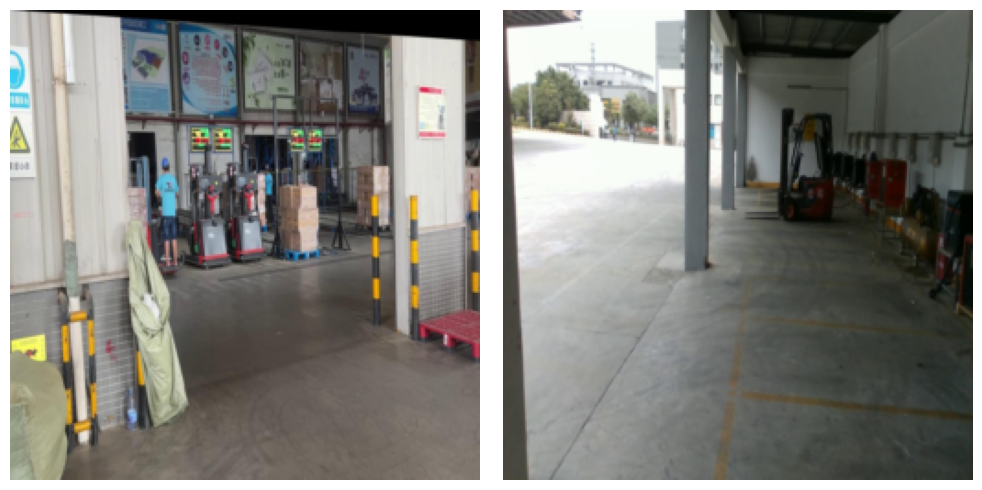

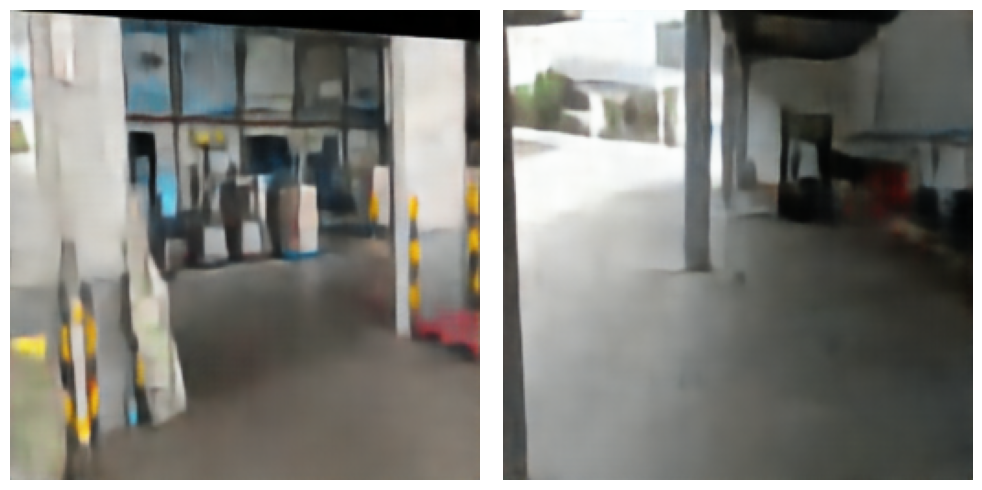

In [83]:
sample = next(iter(train_loader))
display_sample(sample, max_render=5)
recon = model(sample.to('cuda'))[0].detach().to('cpu')
display_sample(recon, max_render=5)

#### SAMPLE INFERENCE

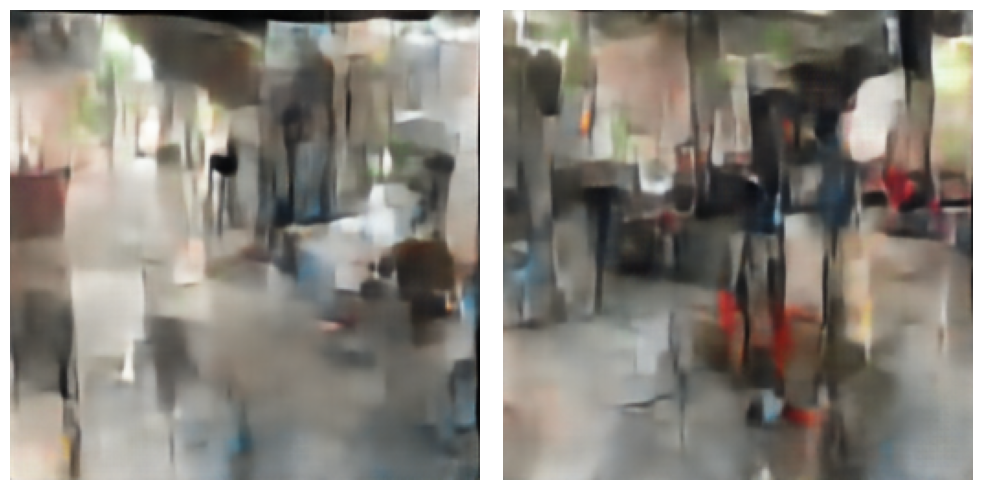

In [84]:
display_sample(model.sample(2, 0).detach().to('cpu'))

## INTEGRATION WITH YOLO

In [256]:
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torchvision.models import detection
from torch.optim.lr_scheduler import StepLR
from torchsummary import summary
import os
import json
import numpy as np
from itertools import chain, islice
from PIL import Image
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import pandas as pd
import shutil
from ultralyticsplus import YOLO, render_result
from PIL import Image 
%matplotlib inline
from IPython.display import display
from torchvision.transforms.functional import rotate
from sklearn.metrics import f1_score, accuracy_score


#### TRAIN YOLO 

In [186]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def train_yolo(root_dir, pretrained_path, config_file, epochs):
    """
    Helper function to train yolov8 on given dataset.
    
    :param root_dir : Filepath
    :param pretrained_path : .pt file
    :param config_file : yaml file
    :param epochs : (Int) Number of epochs.
    """
    yolo = YOLO(pretrained_path)
    yolo.to(device)
    yolo.train(data=os.path.join(root_dir, config_file), epochs=epochs)
    return yolo

root_dir = "datasets"
pretrained_path = "yolov8n.pt"
config_file = "yolov8_forklifts/forklift_config.yaml"
epochs = 20

trained_yolo = train_yolo(root_dir, pretrained_path, config_file, epochs)

Ultralytics YOLOv8.0.21 🚀 Python-3.8.3 torch-2.0.0+cu117 CUDA:0 (Quadro RTX 8000, 48593MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=datasets/yolov8_forklifts/forklift_config.yaml, epochs=20, patience=50, batch=16, imgsz=640, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


train: Scanning /nfs/home/sidsom/datasets/yolov8_forklifts/images/train/labels.c
val: Scanning /nfs/home/sidsom/datasets/yolov8_forklifts/images/val/labels.cache
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train64
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
  0%|          | 0/165 [00:00<?, ?it/s]

My name is YOLO and I have a terrible github


       1/20      2.49G      1.618      3.654      1.314         79        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      2.49G      1.575      3.599      1.289         69        640:  

My name is YOLO and I have a terrible github


       1/20      2.49G      1.588        3.6      1.299         84        640:  

My name is YOLO and I have a terrible github


Exception in thread Thread-24:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 72, in run
    reraise(*_capture_exception())
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/_compat.py", line 115, in reraise
    raise value
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 70, in run
    return old_run_func(self, *a, **kw)
  File "/opt/anaconda3/lib/python3.8/threading.py", line 870, in run
    self._target(*self._args, **self._kwargs)
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/ultralytics/yolo/utils/plotting.py", line 251, in plot_images
    annotator.box_label(box, label, color=color)
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/ultralytics/yolo/utils/plotting.py", line 63,

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      2.64G      1.578      3.542      1.327         80        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      2.64G      1.567      3.528      1.327         87        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20       2.8G      1.572      3.531      1.332         87        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20       2.8G      1.571      3.523      1.338         95        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20       2.8G      1.554      3.503      1.324         89        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20       2.8G       1.54      3.487      1.315         84        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20       2.8G      1.532      3.483      1.312         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20       2.8G      1.522      3.464      1.307         96        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20       2.8G      1.514      3.446      1.301         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G        1.5      3.433      1.293         86        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.486      3.406      1.286         71        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.475      3.378      1.278         58        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.471       3.36      1.275         95        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.471       3.33      1.271         67        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.463      3.289      1.264         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.463      3.264      1.264         98        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.456      3.217      1.261        100        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.455      3.169      1.258         87        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.454      3.151      1.256         82        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.456      3.104      1.254         92        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.452      3.054      1.252         90        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.447      3.009      1.249         56        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.443      2.977      1.247         87        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G       1.44      2.933      1.245         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.434      2.885      1.241         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.431      2.847      1.239         76        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.431      2.834      1.238         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.426      2.807      1.235         85        640:  

My name is YOLO and I have a terrible github


       1/20      3.01G      1.424       2.78      1.233         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G       1.42       2.74       1.23         76        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.417      2.728       1.23         81        640:  

My name is YOLO and I have a terrible github


       1/20      3.01G      1.415      2.703      1.228         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.412       2.68      1.227         72        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G       1.41      2.645      1.226         97        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.405      2.611      1.223         59        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.402      2.589      1.222         72        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.396      2.557      1.219         86        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.389      2.524      1.216         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.386      2.508      1.214         59        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.381      2.479      1.211         84        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.379      2.452       1.21        115        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.376      2.435      1.208         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.371      2.402      1.206         60        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.372      2.388      1.205         90        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G       1.37      2.373      1.205         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.366       2.35      1.203         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G      1.364      2.328      1.202        109        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.01G       1.36      2.314      1.201         91        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.27G      1.355      2.285      1.198         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.27G      1.353      2.271      1.197         97        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.27G      1.351      2.256      1.196         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.27G       1.35      2.237      1.195         90        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.27G      1.349      2.218      1.194        100        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.27G      1.347      2.206      1.194        111        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.27G      1.343      2.186      1.192         90        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.27G      1.341      2.168      1.192         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.27G      1.339      2.156       1.19         82        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.27G      1.337      2.139      1.189         87        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.27G      1.335      2.122      1.187         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.27G      1.334      2.111      1.187         65        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.27G      1.332      2.102      1.186         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       1/20      3.27G      1.333      2.096      1.186         49        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.798      0.682      0.745      0.467
              forklift        355        518      0.786      0.772      0.807      0.576
                person        355        463      0.811      0.592      0.684      0.357


My name is YOLO and I have a terrible github



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       2/20      3.27G       1.18      1.313      1.171         59        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.201      1.344      1.136         71        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G       1.23      1.331      1.141         59        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.225      1.321      1.133         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G       1.24      1.325      1.134         90        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.243      1.332      1.141         79        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.248      1.328      1.145         78        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.233      1.308      1.135         80        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.219       1.29      1.129         67        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.213      1.283      1.124         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.219      1.274      1.123         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.221       1.27      1.122         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.223      1.263      1.122         66        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.223      1.255      1.122         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.227       1.25      1.123         93        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.222      1.245       1.12         83        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.228      1.246      1.121         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.232      1.241      1.121         78        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.228      1.239       1.12         54        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.225      1.237       1.12         70        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.229      1.235      1.124         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.229      1.234      1.124         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.229      1.231      1.124         73        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.229      1.232      1.124         86        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.234      1.232      1.127         61        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G       1.23      1.225      1.126         72        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.231      1.223      1.125         93        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.231      1.222      1.125         72        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.231       1.22      1.126         92        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.226      1.216      1.125         69        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.225      1.216      1.125         89        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.224      1.217      1.125         68        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.226      1.218      1.126         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.224      1.216      1.127         61        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.224      1.214      1.128        104        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.224      1.213      1.128         85        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.225      1.214      1.127         64        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.225      1.212      1.128         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.224      1.209      1.127        106        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.224      1.208      1.127        119        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.225      1.206      1.127         85        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.222      1.205      1.128         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.221      1.205      1.127         92        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G       1.22      1.204      1.127         69        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.219      1.202      1.128         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.219      1.199      1.128         80        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.217      1.197      1.129         62        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.217      1.198      1.129         71        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.216      1.195      1.128         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.215      1.193      1.128         84        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.214      1.192      1.128         54        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.214      1.191      1.128         78        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.213       1.19      1.127         71        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.212      1.189      1.127         86        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.212      1.187      1.128         86        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.213      1.188      1.128         95        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.212      1.186      1.128         80        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.211      1.185      1.128         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.212      1.186      1.128         78        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.213      1.187      1.129         73        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.212      1.185      1.128         58        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.212      1.183      1.128         93        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.212      1.181      1.128         82        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.211       1.18      1.127         85        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.212      1.179      1.128        115        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.211      1.177      1.128         78        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G       1.21      1.176      1.128         72        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G       1.21      1.175      1.128         76        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G       1.21      1.175      1.128         69        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G       1.21      1.174      1.129         89        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.211      1.173      1.129         78        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.211      1.173      1.129         66        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.211      1.171      1.128        115        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G       1.21      1.169      1.129         78        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.211      1.168      1.129        109        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.211      1.168      1.129         99        640:  

My name is YOLO and I have a terrible github


       2/20      3.27G      1.211      1.166      1.128         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       2/20      3.27G      1.212      1.165      1.128         32        640: 1


My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.874      0.731      0.805      0.514
              forklift        355        518      0.882      0.795       0.86      0.629
                person        355        463      0.866      0.667       0.75      0.399

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       3/20      3.27G      1.201      1.044       1.13         78        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.219      1.134      1.136         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.218       1.14      1.146         89        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.215      1.135       1.14         67        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.179      1.102      1.132         94        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.181      1.089      1.137         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.185      1.084      1.133         80        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.182      1.086      1.134         67        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G       1.19      1.085      1.139         59        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.194      1.089      1.138         87        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.191      1.086      1.136         61        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.189      1.094      1.136         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.195      1.098      1.138         70        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G        1.2      1.102      1.139         94        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.197        1.1      1.137         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.199      1.098      1.137         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.199      1.094      1.136         69        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.205      1.096      1.139         76        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.207      1.096      1.138        103        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.203       1.09      1.136         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.209      1.093      1.137         79        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.212      1.096       1.14         72        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G       1.21      1.093      1.139         85        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G       1.21      1.094      1.139         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.209      1.093      1.138        106        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G       1.21      1.093      1.138         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.211      1.092      1.139         90        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.214      1.093       1.14         89        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.216      1.097      1.144         54        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G       1.22      1.099      1.145         91        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.219      1.099      1.146         92        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.218      1.097      1.145         59        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G       1.22      1.096      1.146         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.222      1.096      1.146         80        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.221      1.096      1.146         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.221      1.095      1.147         85        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.224      1.097      1.148         61        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.223      1.096      1.148         80        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.227      1.097       1.15         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.227      1.096       1.15         91        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.227      1.096      1.151        100        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.227      1.095      1.151         78        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.226      1.095       1.15         92        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.227      1.095       1.15         71        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.227      1.094       1.15         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.226      1.093       1.15         72        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.227      1.096      1.151         90        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.227      1.097      1.151         94        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.225      1.095       1.15         89        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.225      1.093       1.15         66        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.226      1.093       1.15         79        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.226      1.094       1.15         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.225      1.091      1.149         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.224       1.09      1.149         94        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.226      1.089      1.149         85        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.225      1.088      1.149         72        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.225      1.088      1.149         61        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.224      1.087      1.149         80        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.223      1.086      1.148         54        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.224      1.089      1.149         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.224      1.089      1.149         86        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.225      1.088      1.149         44        640: 1

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       3/20      3.27G      1.225      1.088      1.149         44        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.726      0.677      0.735      0.425
              forklift        355        518      0.634      0.795       0.78      0.528
                person        355        463      0.818      0.559       0.69      0.321

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       4/20      3.27G      1.363      1.141      1.156         85        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.357      1.164      1.167         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.345      1.148      1.184         94        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.329      1.133      1.195         70        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.297      1.118      1.186        101        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.296       1.12      1.181         80        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.293       1.12      1.187         60        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.276      1.113      1.179         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.282      1.112       1.18         80        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.279      1.111      1.179         91        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.277      1.108      1.177         90        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.268      1.103      1.177         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.266      1.102      1.176         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.267      1.097      1.176         71        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.258      1.092      1.173         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G       1.26      1.094      1.174         63        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.263      1.097      1.179         62        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.264      1.103      1.177         79        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.264      1.104      1.179         65        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.262      1.103      1.178         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.265      1.104       1.18         57        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.269      1.103       1.18         80        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.267        1.1      1.182         78        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.265      1.098      1.181         57        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.263      1.095      1.179         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.264      1.095      1.179         68        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G       1.26      1.093      1.177         72        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.258      1.093      1.177         84        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.259      1.091      1.177         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.258      1.089      1.177         64        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.259      1.088      1.177         61        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.259      1.086      1.177         78        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.259      1.084      1.176         86        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.259      1.085      1.175        101        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G       1.26      1.085      1.175         70        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.257      1.082      1.175         76        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.257      1.081      1.173        102        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.256      1.079      1.172         68        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.256      1.077      1.171         98        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.256      1.076      1.171         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.255      1.078       1.17         61        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.254      1.077      1.171         72        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.253      1.077       1.17         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.254      1.076       1.17         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.253      1.075      1.169        102        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.253      1.074      1.169         50        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.253      1.076      1.169         71        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.256      1.076       1.17         90        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.256      1.075      1.169        103        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.255      1.074      1.169         68        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.255      1.073      1.168        104        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.255      1.073      1.168         54        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.255      1.071      1.168         84        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.254      1.069      1.168         71        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.254      1.068      1.167         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.252      1.067      1.166         96        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.252      1.065      1.166         84        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G      1.251      1.065      1.165         66        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G       1.25      1.065      1.166         65        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G       1.25      1.064      1.165         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G       1.25      1.063      1.165         92        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G       1.25      1.063      1.165         41        640: 1

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       4/20      3.27G       1.25      1.063      1.165         41        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.839      0.722      0.806      0.505
              forklift        355        518      0.913      0.772      0.875      0.628
                person        355        463      0.764      0.672      0.738      0.382

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       5/20      3.27G      1.371       1.08      1.189         97        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.298      1.046      1.168         82        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.282      1.016      1.163         85        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G       1.28      1.021      1.167         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.265      1.011      1.161         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.265      1.011       1.16        109        640:  

My name is YOLO and I have a terrible github


       5/20      3.27G      1.268      1.022      1.173         63        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.262      1.022      1.169         68        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.253      1.016       1.17         70        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.257      1.021      1.171         92        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.246      1.015       1.17         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G       1.24       1.01      1.168         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G       1.24      1.007      1.167         76        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.241      1.005      1.166         79        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.247      1.007      1.168        102        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.246      1.007      1.167        103        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.242      1.006      1.165         92        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.242      1.006      1.164         68        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.242      1.007      1.165         71        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.239      1.002      1.163         86        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.238      1.001      1.163         78        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.238      1.004      1.164         85        640:  

My name is YOLO and I have a terrible github


       5/20      3.27G      1.238      1.003      1.164         71        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.235      1.001      1.163         95        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.236          1      1.162         78        640:  

My name is YOLO and I have a terrible github


       5/20      3.27G      1.235     0.9991      1.162         90        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.235     0.9985      1.159        106        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.234     0.9982       1.16         69        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G       1.23     0.9951      1.158         66        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G       1.23      0.993      1.156        101        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G       1.23     0.9935      1.158         91        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.229     0.9918      1.157         95        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.229     0.9909      1.157         85        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G       1.23     0.9899      1.157         93        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.228     0.9887      1.157         70        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.226     0.9869      1.158         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.226      0.987      1.157         93        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.226     0.9869      1.157         82        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.227     0.9868      1.157         98        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.225     0.9842      1.155         70        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.224     0.9835      1.155        100        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.224     0.9839      1.154         96        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.223     0.9828      1.154         87        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.223     0.9836      1.153         91        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.221     0.9824      1.153         66        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.223     0.9828      1.153         58        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.223     0.9825      1.154         92        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.221     0.9816      1.153         93        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.223     0.9818      1.154         67        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.222      0.982      1.154         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.223     0.9825      1.154         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.222     0.9809      1.153         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.221     0.9806      1.153         94        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.221     0.9807      1.153         70        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.219     0.9795      1.152         95        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G       1.22     0.9799      1.152         57        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.219     0.9801      1.153         60        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G       1.22     0.9807      1.153         86        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.219     0.9805      1.152         88        640:  

My name is YOLO and I have a terrible github


       5/20      3.27G      1.219     0.9805      1.152         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.217     0.9796      1.152         64        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.218     0.9787      1.152         65        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.217     0.9785      1.152         53        640:  

My name is YOLO and I have a terrible github


       5/20      3.27G      1.217     0.9788      1.152         98        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       5/20      3.27G      1.217     0.9792      1.152         29        640: 1


My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981       0.82      0.755      0.806      0.493
              forklift        355        518      0.872       0.84      0.888      0.623
                person        355        463      0.769       0.67      0.724      0.362

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       6/20      3.27G      1.205      1.012      1.155         63        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.216       1.01      1.161         63        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.233      1.027      1.171         97        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G       1.25      1.024       1.18         78        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.238      1.011      1.178         87        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.236      1.002      1.171         78        640:  

My name is YOLO and I have a terrible github


       6/20      3.27G       1.23     0.9995      1.167         79        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.229     0.9995      1.168         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.231     0.9978      1.172         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.226      0.991      1.166         76        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.233     0.9961      1.167         87        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.234     0.9949      1.165         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.234     0.9934      1.167         90        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.227     0.9885      1.162         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.222     0.9833       1.16        121        640:  

My name is YOLO and I have a terrible github


       6/20      3.27G      1.221     0.9802       1.16         86        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.217     0.9762      1.159         86        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.218     0.9761      1.158        104        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.215     0.9733      1.156         90        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.212     0.9699      1.152         96        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.212     0.9667       1.15         87        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.213     0.9669      1.151         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.212     0.9644      1.151         69        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.212      0.963      1.151         80        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.211     0.9604      1.152         76        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.208     0.9583      1.151         80        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.208     0.9584      1.151         87        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.208     0.9576       1.15         65        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.206     0.9546      1.149        104        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.205     0.9523       1.15         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.205     0.9508       1.15         78        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.206     0.9487      1.151         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.206     0.9473      1.149         79        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.205     0.9471      1.148         74        640:  

My name is YOLO and I have a terrible github


       6/20      3.27G      1.207     0.9477      1.148         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.206     0.9466      1.147         61        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.206      0.946      1.146        102        640:  

My name is YOLO and I have a terrible github


       6/20      3.27G      1.206     0.9466      1.146         69        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.207     0.9475      1.146         62        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.205     0.9456      1.145         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.204     0.9455      1.145         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.203     0.9426      1.143         87        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.201     0.9413      1.143         69        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.199       0.94      1.142         79        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.199     0.9393      1.142         62        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.198     0.9379      1.141        106        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.196     0.9377      1.141         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.196     0.9374      1.141         57        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.196      0.936      1.142         62        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.196     0.9354      1.142         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.196     0.9353      1.142         63        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.196     0.9363      1.142         62        640:  

My name is YOLO and I have a terrible github


       6/20      3.27G      1.196     0.9358      1.141         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.197      0.938      1.142         90        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.196     0.9367       1.14         82        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.196     0.9372      1.141        103        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.196     0.9376      1.141         62        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.192     0.9352       1.14         55        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.194     0.9351       1.14        107        640:  

My name is YOLO and I have a terrible github


       6/20      3.27G      1.193     0.9349      1.139         89        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.194      0.935       1.14         65        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.193     0.9342       1.14         81        640:  

My name is YOLO and I have a terrible github


       6/20      3.27G      1.193     0.9341       1.14         79        640:  

My name is YOLO and I have a terrible github


       6/20      3.27G      1.193      0.934       1.14         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       6/20      3.27G      1.193     0.9331       1.14         56        640: 1


My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.795      0.771      0.813      0.503
              forklift        355        518      0.795      0.865       0.88       0.63
                person        355        463      0.795      0.678      0.747      0.375

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       7/20      3.27G      1.251     0.8523      1.144         91        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.194     0.8924      1.106        100        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.204     0.9054       1.11         89        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.214     0.9206       1.12         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.211     0.9282      1.116         85        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G       1.19     0.9239      1.112         82        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.193     0.9364      1.119         72        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.182       0.93      1.112         76        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.186     0.9282      1.114         93        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G       1.18     0.9269       1.12         62        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.176     0.9243      1.122         64        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.168     0.9179      1.119         84        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.168     0.9142      1.123         87        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.173     0.9086      1.124         76        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.169     0.9038      1.119         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.172     0.9047      1.119        116        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G       1.17     0.9009      1.119         95        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.171     0.8989      1.119        106        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G       1.17     0.9002      1.118         59        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.171     0.8983       1.12         98        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G       1.17     0.8971       1.12         63        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.169     0.8948       1.12         97        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G       1.17     0.8928      1.123         51        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.169     0.8913      1.123         96        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.168     0.8891      1.123         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.168     0.8881      1.124         93        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.171     0.8892      1.124         85        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.171     0.8882      1.123         99        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G       1.17     0.8873      1.122         47        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.171     0.8883      1.122         89        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.172     0.8928      1.123         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.172     0.8924      1.124         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.174     0.8923      1.125         72        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.172     0.8907      1.125         79        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.173     0.8913      1.127         55        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.171     0.8905      1.126         94        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.169     0.8889      1.126         76        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.168     0.8888      1.125         68        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.169     0.8886      1.126         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.169     0.8875      1.126         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.169      0.888      1.125         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.167     0.8885      1.125         67        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.167     0.8876      1.125         81        640:  

My name is YOLO and I have a terrible github


       7/20      3.27G      1.167     0.8879      1.125         83        640:  

My name is YOLO and I have a terrible github


       7/20      3.27G      1.166     0.8867      1.123         87        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.166      0.888      1.123         70        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.165     0.8873      1.123         86        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.165     0.8865      1.124         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.165     0.8863      1.124         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.164     0.8845      1.123         87        640:  

My name is YOLO and I have a terrible github


       7/20      3.27G      1.163     0.8839      1.122         77        640:  

My name is YOLO and I have a terrible github


       7/20      3.27G      1.162     0.8835      1.122         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.162     0.8834      1.122         92        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.161     0.8822      1.122         73        640:  

My name is YOLO and I have a terrible github


       7/20      3.27G      1.161     0.8814      1.122         78        640:  

My name is YOLO and I have a terrible github


       7/20      3.27G      1.159     0.8795      1.121         82        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.157     0.8779      1.121         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.158     0.8776      1.121         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.158     0.8771      1.119         98        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.157     0.8774      1.119         79        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.158     0.8775      1.119         76        640:  

My name is YOLO and I have a terrible github


       7/20      3.27G      1.157     0.8768      1.119         85        640:  

My name is YOLO and I have a terrible github


       7/20      3.27G      1.158      0.877      1.119        111        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.157     0.8756      1.119         60        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.156     0.8745      1.119         90        640:  

My name is YOLO and I have a terrible github


       7/20      3.27G      1.157     0.8747      1.119         87        640:  

My name is YOLO and I have a terrible github


       7/20      3.27G      1.156     0.8743      1.118         53        640: 1

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       7/20      3.27G      1.156     0.8743      1.118         53        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.793       0.78      0.819      0.532
              forklift        355        518      0.829      0.871      0.895      0.656
                person        355        463      0.758      0.689      0.743      0.408

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       8/20      3.27G      1.205      0.938      1.163         60        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.196     0.8676      1.118         89        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.181     0.8667      1.113         79        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.189     0.8613       1.12         92        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G       1.18     0.8606      1.115         86        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.176      0.867      1.117         98        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.174     0.8636      1.122         66        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G       1.17     0.8672      1.122         69        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.171     0.8704      1.125         57        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.176     0.8739      1.127         98        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.174     0.8741      1.124         65        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.167      0.872      1.122         85        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.168     0.8735      1.126         79        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.164     0.8684      1.124         86        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.159     0.8656      1.122         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.163     0.8673      1.121         97        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.159     0.8627      1.119         57        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.161     0.8611      1.119         97        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.161     0.8605       1.12         85        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.161     0.8595      1.121         71        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G       1.16     0.8587       1.12         85        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.159     0.8579      1.119         98        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.156     0.8567       1.12         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.156     0.8548      1.118         86        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.158     0.8576       1.12         82        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.154     0.8565      1.118         86        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.152     0.8539      1.118         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.152     0.8548      1.117         85        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G       1.15     0.8505      1.116         78        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.147     0.8485      1.115         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.147     0.8519      1.116         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.148     0.8534      1.115         95        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.151     0.8541      1.116         97        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.149     0.8544      1.116         68        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.148     0.8547      1.116         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.148     0.8549      1.116         72        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.147     0.8545      1.116         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.145     0.8531      1.115         91        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.144     0.8525      1.115         78        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.144     0.8533      1.115        109        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.143     0.8527      1.114         69        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.143     0.8522      1.114         66        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.142     0.8506      1.114         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.143     0.8518      1.116         69        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.143     0.8508      1.116         92        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.142      0.849      1.115         93        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.142     0.8499      1.115         71        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.141     0.8488      1.116         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.142     0.8487      1.116         90        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.141     0.8482      1.115         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.142     0.8485      1.116         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.143     0.8487      1.116         84        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.142     0.8479      1.114         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.143     0.8477      1.115         91        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.142     0.8463      1.114         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.141     0.8462      1.114         69        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G       1.14     0.8461      1.114         76        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.141     0.8451      1.114         95        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.141     0.8454      1.113         76        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.142     0.8448      1.113         78        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.142     0.8437      1.113         84        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       8/20      3.27G      1.141     0.8432      1.112         37        640: 1

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github



                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.876      0.791      0.861      0.555
              forklift        355        518      0.902      0.869      0.913      0.683
                person        355        463       0.85      0.713      0.809      0.427

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       9/20      3.27G      1.059     0.8009       1.08         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G       1.13     0.8226      1.095         84        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G       1.12     0.8306      1.105         58        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.096     0.8242      1.086         82        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.115     0.8338      1.095         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.119      0.831      1.099         89        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.118     0.8303      1.105         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.124     0.8402      1.105         61        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.123     0.8382      1.102        101        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.124     0.8357      1.101         82        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.119     0.8269      1.095         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.122     0.8295      1.095         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.118     0.8237      1.093         87        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.115     0.8212      1.095         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.115     0.8208      1.093         90        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.114     0.8195      1.092         87        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.115     0.8196      1.092         85        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.113     0.8174      1.093         68        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.112     0.8162      1.091         95        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G       1.11      0.817      1.091         71        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.111     0.8194      1.092         79        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.111     0.8191      1.092         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G       1.11     0.8204      1.093         85        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G       1.11     0.8204      1.093         65        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.109     0.8186      1.093         69        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.102     0.8148      1.091         72        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.101     0.8137      1.091         66        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.103      0.815       1.09        115        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.105     0.8177      1.092         99        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.107     0.8162      1.092         84        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.106     0.8169      1.093         82        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.105     0.8175      1.093         69        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.106     0.8177      1.093         79        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.107     0.8159      1.092         80        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.106      0.815      1.092         75        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.106      0.814      1.091         96        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.104     0.8135      1.091         72        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.108      0.813      1.093         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.108     0.8121      1.093        105        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.108     0.8115      1.093         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.111     0.8115      1.093         78        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.111     0.8112      1.093         77        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.111     0.8124      1.094         97        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.112     0.8115      1.094         94        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.112     0.8122      1.093         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.112     0.8125      1.094         78        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.112     0.8137      1.094         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.111     0.8132      1.094         91        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G       1.11     0.8132      1.094         64        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G       1.11     0.8127      1.093         94        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.111     0.8145      1.094         86        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.112      0.813      1.094         96        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.111     0.8123      1.094         58        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.109     0.8107      1.094         78        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G       1.11     0.8101      1.095         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G       1.11     0.8103      1.095         98        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G       1.11     0.8101      1.095         82        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G       1.11     0.8104      1.096         96        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.112     0.8107      1.096         87        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.111     0.8099      1.096         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.111     0.8097      1.096         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G       1.11     0.8091      1.095         82        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G       1.11     0.8093      1.095        102        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G       1.11     0.8084      1.095         80        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.107     0.8072      1.094         96        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.106     0.8066      1.094         66        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.106     0.8065      1.094         67        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.106     0.8052      1.094         95        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.106     0.8043      1.094         87        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.105      0.804      1.094         64        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.105     0.8038      1.094         79        640:  

My name is YOLO and I have a terrible github


       9/20      3.27G      1.106     0.8041      1.094         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


       9/20      3.27G      1.107     0.8048      1.095         39        640: 1


My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.854       0.82      0.866      0.553
              forklift        355        518      0.887        0.9      0.921      0.676
                person        355        463      0.821      0.741       0.81      0.431

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      10/20      3.27G      1.085     0.7922      1.094         63        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.103     0.7762      1.096         68        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.065     0.7641      1.079         85        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.063     0.7731      1.082         99        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.064     0.7778      1.086         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.074     0.7806      1.088         58        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.079     0.7836      1.089         87        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G       1.08     0.7793      1.093         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G       1.08     0.7777      1.091         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.089     0.7823      1.094         91        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.097     0.7848      1.095         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.094     0.7816      1.094         82        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.094     0.7816      1.094         64        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.088     0.7785       1.09         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.088     0.7777      1.092         79        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.087     0.7761      1.091         82        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.085     0.7737      1.091         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.089     0.7736      1.092         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.086     0.7721      1.091         66        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.082     0.7715      1.091         64        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.082     0.7727       1.09         65        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.083     0.7734      1.089         77        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.084     0.7733      1.089         76        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.081      0.771      1.088         82        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.082     0.7701      1.088         76        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.082     0.7694      1.088         74        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.081     0.7685      1.087        104        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.082     0.7713      1.089         67        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.087     0.7724      1.092         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.086     0.7706      1.091         78        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.088     0.7711      1.092         76        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.089     0.7711      1.093         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.086     0.7686      1.091         98        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.085      0.767      1.092         74        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.086     0.7671      1.091         74        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.087     0.7679      1.093         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.086     0.7672      1.093         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.086     0.7677      1.092         66        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.086     0.7667      1.092         87        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.086     0.7664      1.091         84        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.086     0.7644      1.091         65        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.089     0.7648      1.092         93        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.089     0.7643      1.092         71        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.088      0.764      1.092         72        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.091     0.7656      1.093         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.091      0.765      1.092         90        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.091     0.7646      1.092         99        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.092      0.765      1.092         89        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.091     0.7657      1.092         75        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.091     0.7654      1.091         91        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.092     0.7659      1.091         86        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.093     0.7663      1.092         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.092     0.7671      1.093         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.092     0.7672      1.092         81        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.092     0.7672      1.092         82        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.091     0.7668      1.092         85        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G       1.09     0.7666      1.091         66        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G       1.09      0.767      1.091         92        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G       1.09     0.7663      1.091         80        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.088     0.7655      1.089        100        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.089      0.767      1.089         68        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.091     0.7678       1.09         84        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.091     0.7678       1.09         97        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G       1.09     0.7671      1.089         69        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G       1.09     0.7666      1.088         70        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G       1.09     0.7662      1.088         98        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G       1.09     0.7656      1.087         95        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G       1.09     0.7652      1.088         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.089     0.7656      1.087         94        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.089     0.7659      1.087         90        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.089     0.7658      1.087         76        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.089     0.7653      1.087         82        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.089     0.7647      1.086         89        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.088     0.7645      1.086         89        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.088     0.7644      1.087         83        640:  

My name is YOLO and I have a terrible github


      10/20      3.27G      1.088     0.7649      1.086         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      10/20      3.27G      1.088     0.7646      1.086         41        640: 1


My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.894      0.811      0.877      0.573
              forklift        355        518      0.893      0.886      0.923      0.704
                person        355        463      0.895      0.737       0.83      0.443
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      11/20      3.27G      1.005     0.9196      1.083         32        640:  Exception in thread Thread-57:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 72, in run
    reraise(*_capture_exception())
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/_compat.py", line 115, in reraise
    raise value
  File "/nfs/home/sidsom/

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.039     0.8864      1.061         34        640:  Exception in thread Thread-58:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 72, in run
    reraise(*_capture_exception())
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/_compat.py", line 115, in reraise
    raise value
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 70, in run
    return old_run_func(self, *a, **kw)
  File "/opt/anaconda3/lib/python3.8/threading.py", line 870, in run
    self._target(*self._args, **self._kwargs)
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/ultralytics/yolo/utils/plotting.py", line 251, in plot_images
    annotator.box_label(box, label, color=color)
  File "/nfs/home/sidsom/smir

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.043     0.7948      1.078         30        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.041     0.7998      1.077         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.035     0.7758       1.08         32        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.052     0.7681      1.077         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.048       0.77      1.076         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.059     0.7751      1.077         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.065      0.776      1.076         48        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.068     0.7709       1.07         51        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.068     0.7657      1.072         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.074     0.7645      1.074         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.067     0.7599      1.075         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.065     0.7561      1.071         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G       1.07     0.7551      1.073         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G       1.07     0.7563       1.07         52        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.073     0.7545       1.07         52        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.073     0.7568       1.07         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G       1.07     0.7489      1.068         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G       1.07     0.7484      1.068         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.069     0.7453      1.068         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.071     0.7454      1.069         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.071     0.7439      1.071         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G       1.07     0.7415       1.07         32        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G       1.07     0.7401      1.071         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G       1.07     0.7421      1.069         47        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.072      0.743       1.07         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.071      0.742      1.067         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.073     0.7419      1.069         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.071     0.7413      1.069         27        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.072      0.741       1.07         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.073     0.7397       1.07         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.071     0.7371      1.068         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.069     0.7345      1.067         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.068     0.7358      1.066         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.069     0.7362      1.065         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.068     0.7356      1.065         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.071     0.7352      1.066         52        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.068     0.7337      1.066         30        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.068     0.7335      1.066         53        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.069     0.7326      1.066         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.067     0.7321      1.065         31        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G       1.07      0.733      1.066         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.069     0.7327      1.068         29        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.071     0.7331      1.069         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.072     0.7334       1.07         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.071     0.7333       1.07         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.072     0.7335      1.071         29        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.074     0.7333      1.071         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.073     0.7331      1.071         40        640:  

My name is YOLO and I have a terrible github


      11/20      3.27G      1.072     0.7315      1.071         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.072      0.731      1.071         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.074     0.7316      1.072         50        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.074     0.7308      1.072         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.075     0.7301      1.072         19        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      11/20      3.27G      1.075     0.7301      1.072         19        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.822      0.783      0.849      0.546
              forklift        355        518      0.811      0.902      0.912      0.673
                person        355        463      0.832      0.664      0.787       0.42

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      12/20      3.27G      1.127     0.6914      1.093         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.071     0.7506      1.067         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.049     0.7306      1.048         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G       1.07     0.7217      1.065         58        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.091      0.727      1.081         31        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.097     0.7269      1.083         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.094     0.7264      1.077         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.092     0.7277      1.075         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.086     0.7261      1.073         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G       1.08     0.7252      1.074         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.077     0.7213      1.076         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.081     0.7297      1.076         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.076     0.7281      1.072         55        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.074     0.7322      1.072         49        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.072     0.7306      1.074         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.069     0.7317      1.075         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.064     0.7274      1.073         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.066     0.7247      1.075         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.064     0.7251      1.076         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.063     0.7217      1.074         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G       1.06     0.7209      1.074         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G       1.06     0.7202      1.076         31        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.058     0.7177      1.077         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.055     0.7174      1.075         29        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.053     0.7145      1.072         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.054     0.7156      1.074         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.051     0.7146      1.072         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.053     0.7158      1.073         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.055     0.7159      1.072         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.058     0.7178      1.071         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.061     0.7177      1.073         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.058     0.7169      1.071         51        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G       1.06     0.7159      1.072         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.061     0.7169      1.072         31        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.062     0.7159      1.073         47        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.062     0.7162      1.072         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.061     0.7165      1.072         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.063     0.7171      1.072         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.065     0.7164      1.073         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.064     0.7161      1.071         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.064     0.7162      1.071         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.064     0.7171      1.071         28        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.062     0.7145       1.07         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.062     0.7137      1.069         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.061     0.7139      1.069         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G       1.06     0.7142      1.069         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.061     0.7146       1.07         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.062     0.7141      1.071         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.062     0.7139      1.071         31        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.061     0.7139      1.071         31        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.062     0.7134      1.071         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.061     0.7127       1.07         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.061     0.7112       1.07         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.061     0.7103       1.07         30        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      12/20      3.27G      1.061     0.7103       1.07         15        640: 1

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github



                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.886      0.798      0.861      0.571
              forklift        355        518      0.917       0.88      0.928      0.711
                person        355        463      0.854      0.717      0.795      0.431

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      13/20      3.27G      1.089     0.7101      1.075         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.083     0.6958      1.069         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.061     0.6917      1.066         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.051     0.6852      1.068         50        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.055     0.6885      1.064         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.045     0.6814      1.058         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.041     0.6802      1.057         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.041     0.6884      1.057         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.039     0.6866      1.061         32        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.045     0.6916      1.062         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.046     0.6886      1.063         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.057     0.6916      1.066         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.059     0.6926      1.066         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.057     0.6914      1.067         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.054     0.6883      1.065         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.049     0.6848      1.063         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G       1.05     0.6833      1.064         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.053     0.6843      1.066         53        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.054     0.6844      1.066         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G       1.05     0.6845      1.065         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.053     0.6874      1.065         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.054     0.6871      1.064         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.051     0.6853      1.064         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.047     0.6827      1.063         47        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G       1.05     0.6831      1.064         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.044     0.6832      1.062         24        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.042     0.6822      1.062         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.039     0.6814      1.061         32        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.038     0.6804      1.059         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.038     0.6807      1.057         51        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G       1.04       0.68      1.057         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.041     0.6807      1.057         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.042     0.6794      1.056         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.042     0.6787      1.058         29        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.042     0.6773      1.058         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G       1.04     0.6782      1.058         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.041     0.6785      1.058         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.041      0.678      1.058         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.037     0.6766      1.056         28        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.037     0.6767      1.056         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.038     0.6773      1.056         29        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.037     0.6761      1.056         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.036     0.6761      1.055         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.036     0.6775      1.054         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.036      0.677      1.054         54        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.034     0.6764      1.053         30        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.036     0.6768      1.053         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.036     0.6779      1.052         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.035     0.6778      1.053         31        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.034     0.6771      1.052         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.034     0.6767      1.051         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.034     0.6765      1.052         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.034     0.6763      1.051         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.035     0.6762      1.051         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      13/20      3.27G      1.036     0.6761      1.051         17        640: 1


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.858       0.81      0.868      0.576
              forklift        355        518      0.874      0.888      0.927      0.715
                person        355        463      0.841      0.732      0.809      0.437

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      14/20      3.27G      1.038     0.7244      1.053         48        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.016     0.6969      1.038         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.024     0.6913      1.032         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.024     0.7009      1.026         49        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.012     0.6934      1.026         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.017      0.697      1.031         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.017     0.6964      1.028         52        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.007     0.6952      1.033         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.006     0.6942      1.034         47        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.019        0.7      1.042         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G       1.02     0.6993      1.041         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.016     0.6936      1.037         49        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.018     0.6884      1.035         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.009     0.6805      1.031         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.009     0.6807      1.031         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.013     0.6797      1.031         47        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.012     0.6791       1.03         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.011     0.6751       1.03         32        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.007     0.6737      1.029         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.006     0.6727       1.03         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.003     0.6698      1.029         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.004     0.6681      1.029         50        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.003     0.6658      1.028         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.004     0.6641      1.029         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.004     0.6621      1.031         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.002     0.6607      1.032         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.004     0.6611      1.033         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.005     0.6603      1.034         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.004       0.66      1.033         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.004     0.6589      1.034         32        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.005     0.6582      1.035         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.009     0.6597      1.037         26        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.007     0.6592      1.036         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G       1.01     0.6606      1.037         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.008     0.6593      1.036         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.006     0.6582      1.036         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.005     0.6565      1.036         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.005     0.6555      1.035         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.008     0.6574      1.036         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G       1.01     0.6564      1.036         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.011     0.6561      1.037         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.011     0.6553      1.037         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G       1.01     0.6543      1.036         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.009     0.6542      1.037         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G       1.01      0.654      1.037         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.012     0.6536      1.038         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.012     0.6541      1.038         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G       1.01     0.6538      1.037         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.009     0.6527      1.038         31        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G       1.01     0.6528      1.039         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.009      0.652      1.038         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G       1.01     0.6517      1.039         52        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G       1.01     0.6514       1.04         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.009     0.6518      1.039         49        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.009     0.6523      1.039         15        640: 1

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      14/20      3.27G      1.009     0.6523      1.039         15        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.888       0.83      0.889      0.594
              forklift        355        518      0.913      0.894      0.935      0.725
                person        355        463      0.864      0.766      0.844      0.463

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      15/20      3.27G     0.8974     0.6103     0.9916         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9539       0.62      1.035         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9368     0.5982      1.022         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9502     0.6015      1.026         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9516     0.6023      1.023         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9561     0.6073      1.025         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9625     0.6155      1.029         30        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9647     0.6134      1.031         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9625     0.6123      1.032         32        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9719     0.6198      1.032         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9727     0.6226      1.031         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9686     0.6221      1.026         50        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9676     0.6219      1.024         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9636     0.6218      1.025         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G      0.966     0.6229      1.027         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9641     0.6216      1.025         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9634     0.6216      1.024         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9682     0.6233      1.025         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9702     0.6238      1.024         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9763     0.6298      1.026         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G       0.97     0.6263      1.023         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9681     0.6245      1.023         29        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9646     0.6221      1.021         31        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9665     0.6223      1.022         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9669     0.6231      1.022         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9685     0.6239      1.024         51        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9693     0.6236      1.024         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9697     0.6243      1.023         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9718     0.6239      1.024         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9726     0.6244      1.024         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9721     0.6235      1.025         59        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9727     0.6238      1.026         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9731     0.6235      1.026         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9754     0.6245      1.026         49        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9725     0.6229      1.024         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9741     0.6232      1.025         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9744     0.6229      1.025         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G      0.974     0.6232      1.026         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9743     0.6228      1.026         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9753     0.6233      1.026         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9775      0.623      1.027         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9782     0.6235      1.027         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9795     0.6263      1.027         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9809     0.6258      1.028         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9828     0.6268      1.029         54        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9826     0.6257      1.028         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9812     0.6258      1.028         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9808     0.6252      1.028         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9818     0.6261      1.028         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9821     0.6262      1.029         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9817     0.6262      1.028         30        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9806     0.6252      1.028         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9803     0.6259      1.028         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9806     0.6248      1.028         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9802     0.6237      1.028         15        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      15/20      3.27G     0.9802     0.6237      1.028         15        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981       0.89      0.831      0.888      0.598
              forklift        355        518      0.926      0.897      0.942      0.731
                person        355        463      0.853      0.765      0.833      0.465

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      16/20      3.27G      1.002     0.6073       1.05         27        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9763     0.5997      1.027         31        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G      1.018      0.612      1.027         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G      1.034     0.6197      1.029         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G      1.007     0.6081      1.025         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G      1.004     0.6141      1.025         26        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G      1.004     0.6144       1.03         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9952     0.6151      1.025         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G      1.002     0.6136      1.026         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G      1.002     0.6114      1.025         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9958     0.6102      1.027         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9972     0.6118      1.027         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9924     0.6064      1.025         32        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9911     0.6067      1.023         47        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9917     0.6047      1.022         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9917     0.6052      1.022         47        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9911     0.6052      1.021         59        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9876     0.6038       1.02         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9882     0.6056      1.019         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9872     0.6057       1.02         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9855     0.6033       1.02         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G      0.988     0.6037      1.019         30        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9915     0.6053       1.02         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9895     0.6042       1.02         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9877     0.6047      1.019         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9898     0.6059       1.02         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9897     0.6054       1.02         55        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9847     0.6034      1.019         29        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9836     0.6037      1.018         31        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9834     0.6044      1.019         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9853     0.6052       1.02         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9889     0.6057      1.022         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9897     0.6059      1.022         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9855     0.6044      1.022         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9829     0.6033      1.021         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9838     0.6034      1.021         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9844     0.6042       1.02         57        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9848     0.6045      1.021         27        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9841     0.6037      1.021         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9847     0.6037       1.02         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9849     0.6035       1.02         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9838      0.603       1.02         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9819     0.6014      1.019         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9813     0.6016      1.018         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9805      0.601      1.018         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9808     0.6021      1.019         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9776     0.6003      1.018         32        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9778        0.6      1.019         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9782     0.6001      1.018         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9762     0.5989      1.018         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9752      0.598      1.017         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9763     0.5984      1.018         47        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9749      0.598      1.017         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9747      0.599      1.017         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9744     0.5988      1.017         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      16/20      3.27G     0.9752     0.5994      1.017         24        640: 1


My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.891      0.847      0.896      0.605
              forklift        355        518       0.92      0.913      0.945      0.738
                person        355        463      0.862      0.781      0.848      0.472

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      17/20      3.27G      0.952     0.5646      1.015         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9644     0.5791      1.015         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9505      0.581      1.008         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9604     0.5892       1.01         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9563     0.5796      1.016         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9494     0.5732      1.009         30        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9477     0.5746      1.006         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9321     0.5692     0.9974         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9386     0.5751     0.9989         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9304     0.5723      0.997         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9342     0.5773     0.9973         47        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9266     0.5736     0.9938         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9341     0.5795     0.9953         50        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9384     0.5809     0.9964         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9367     0.5807     0.9962         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G      0.933     0.5793     0.9948         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9306     0.5792     0.9929         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9305     0.5777     0.9933         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9295     0.5758     0.9919         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9305     0.5762     0.9929         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9281     0.5769     0.9922         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9292     0.5789     0.9929         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9312     0.5803     0.9951         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9303     0.5801     0.9947         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G      0.934     0.5822     0.9956         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9358     0.5806     0.9968         31        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9407     0.5807     0.9988         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9417     0.5807     0.9978         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9406     0.5807     0.9974         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9416     0.5807     0.9972         31        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9426     0.5814     0.9969         48        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G      0.938     0.5792     0.9948         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9383     0.5796     0.9952         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9403       0.58     0.9949         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9403     0.5804     0.9955         49        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9397     0.5793     0.9972         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9384     0.5785     0.9971         31        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9389     0.5789     0.9972         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9389     0.5792     0.9972         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9393     0.5793     0.9971         58        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9388     0.5786     0.9975         47        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9378     0.5788     0.9973         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9379     0.5785     0.9978         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9382     0.5781      0.999         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9373     0.5782      0.999         29        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9385     0.5784     0.9993         51        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G      0.938     0.5783     0.9992         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9382     0.5784     0.9996         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9354     0.5768     0.9984         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9362     0.5765     0.9976         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9354     0.5768      0.998         47        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9344     0.5768     0.9979         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9343     0.5775      0.998         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G     0.9345      0.577     0.9983         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      17/20      3.27G      0.935     0.5768      0.998         22        640: 1


My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.877      0.841      0.886      0.595
              forklift        355        518      0.912      0.913      0.933      0.727
                person        355        463      0.843      0.769      0.839      0.463

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      18/20      3.27G     0.9884     0.6586      1.013         53        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.8954     0.5795     0.9757         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9134     0.5904     0.9818         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G       0.92     0.5885     0.9804         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9392     0.5947     0.9906         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G      0.945     0.5933     0.9921         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9257      0.582     0.9831         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9216     0.5823     0.9847         31        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9263     0.5856     0.9829         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9329     0.5889      0.984         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G      0.935     0.5839     0.9843         28        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9373     0.5857     0.9856         47        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G      0.938     0.5855     0.9828         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9304     0.5841     0.9833         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9273     0.5805     0.9833         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9256     0.5787     0.9859         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9213     0.5753     0.9841         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G      0.922      0.575      0.984         29        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9233     0.5731     0.9844         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9244     0.5715     0.9835         50        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G      0.924     0.5689     0.9848         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9224     0.5675     0.9841         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9265     0.5692      0.984         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9235     0.5673     0.9838         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9231     0.5661     0.9843         27        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9209     0.5646     0.9843         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9226     0.5654     0.9847         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9226     0.5649     0.9853         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G      0.927     0.5681     0.9859         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9245     0.5666     0.9847         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9182     0.5629     0.9829         28        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9178     0.5617     0.9825         48        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9174     0.5625      0.982         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9165     0.5623     0.9814         50        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9168     0.5621     0.9821         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9157     0.5622     0.9811         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G      0.915     0.5623      0.981         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9157      0.562     0.9812         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9168     0.5617      0.982         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9176     0.5616     0.9821         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9161     0.5604     0.9813         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9168     0.5607     0.9828         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9181     0.5611     0.9834         49        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G      0.916     0.5604     0.9829         30        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9173     0.5598     0.9832         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9189     0.5601     0.9845         50        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9191     0.5601     0.9849         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G       0.92     0.5612     0.9851         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G      0.919     0.5606     0.9844         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9178     0.5604      0.984         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9175     0.5609     0.9841         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9182     0.5607     0.9847         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9176     0.5601     0.9852         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9172     0.5595     0.9851         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      18/20      3.27G     0.9184     0.5614     0.9858         26        640: 1


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.868      0.867      0.904      0.618
              forklift        355        518      0.862      0.925      0.944      0.747
                person        355        463      0.875       0.81      0.864      0.489

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      19/20      3.27G     0.9836      0.596     0.9592         57        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.9076     0.5706     0.9575         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8964     0.5561     0.9533         49        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.9081     0.5573     0.9585         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.9053      0.549     0.9653         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8919     0.5439     0.9655         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8849     0.5395     0.9676         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8841       0.54     0.9673         31        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8901     0.5423      0.968         30        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8861     0.5383      0.965         47        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8808     0.5375     0.9618         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8882     0.5392     0.9664         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8795     0.5364      0.965         27        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8877     0.5398     0.9668         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8897     0.5401     0.9673         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8902     0.5413     0.9694         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8889     0.5431     0.9694         46        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8903     0.5444     0.9689         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8897     0.5442     0.9689         49        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8926     0.5457     0.9685         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8906     0.5439     0.9679         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8922     0.5437     0.9677         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G      0.893     0.5443      0.968         51        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8888     0.5431     0.9672         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8889     0.5437     0.9669         52        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8919     0.5455     0.9692         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8893      0.544     0.9691         32        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8899     0.5435     0.9708         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8904     0.5434     0.9711         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8924     0.5421     0.9713         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8897     0.5414     0.9701         48        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8871       0.54     0.9701         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8864     0.5406     0.9707         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8875     0.5411     0.9706         31        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8887     0.5409     0.9716         49        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8891     0.5402     0.9719         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8875     0.5394     0.9718         48        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8888       0.54     0.9722         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8896     0.5413     0.9723         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8873     0.5399     0.9715         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G      0.886     0.5398     0.9711         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8844      0.539     0.9708         50        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8835     0.5385     0.9701         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8837     0.5386     0.9702         24        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8826     0.5386     0.9703         39        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8824     0.5385     0.9702         47        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G      0.884     0.5385     0.9704         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8846     0.5385     0.9703         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8848     0.5378     0.9703         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8835     0.5368       0.97         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8826     0.5361     0.9701         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G      0.883     0.5356     0.9708         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G      0.884      0.536     0.9708         48        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8866     0.5375     0.9715         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      19/20      3.27G     0.8881     0.5379     0.9724         24        640: 1


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.861      0.879        0.9      0.614
              forklift        355        518      0.904      0.927      0.949      0.757
                person        355        463      0.818      0.832      0.852      0.471

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      20/20      3.27G     0.8613     0.5275     0.9715         45        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8857     0.5297     0.9766         31        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8604     0.5276     0.9517         30        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8699     0.5246     0.9595         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8566     0.5236     0.9596         33        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8607      0.522     0.9635         30        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8779     0.5267     0.9695         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8793     0.5272     0.9709         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8733     0.5239     0.9729         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8796     0.5273     0.9728         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8816      0.525     0.9755         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8773     0.5221      0.973         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8783     0.5231     0.9726         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8763     0.5222     0.9709         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8762     0.5195     0.9716         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8789     0.5193     0.9717         47        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8789     0.5187     0.9713         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8764     0.5189     0.9712         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G      0.875     0.5193     0.9701         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8765     0.5192     0.9705         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8752     0.5178     0.9704         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8761     0.5183     0.9704         30        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G      0.879      0.522     0.9704         58        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8797     0.5221     0.9701         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8803     0.5248     0.9707         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G      0.882     0.5266     0.9716         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8812     0.5255     0.9717         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8822     0.5256     0.9706         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8805     0.5238     0.9701         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8806     0.5239     0.9691         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G       0.88      0.523     0.9678         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8818     0.5226     0.9678         57        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8837     0.5225      0.968         41        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8845     0.5218     0.9683         34        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8837      0.521      0.968         48        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8838     0.5223     0.9689         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G      0.884     0.5224     0.9689         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8826     0.5213     0.9686         42        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8838     0.5213     0.9692         47        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G      0.883     0.5214     0.9702         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8831     0.5211     0.9712         35        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8812     0.5209     0.9701         32        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8795     0.5206     0.9699         47        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8785     0.5197       0.97         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8793     0.5195     0.9707         49        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8779     0.5192     0.9699         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G      0.877     0.5188     0.9697         44        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8757     0.5181     0.9687         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G      0.876     0.5193     0.9688         43        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8756     0.5193     0.9682         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8758     0.5199      0.968         40        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8762     0.5201     0.9686         36        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8765     0.5198     0.9686         38        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G      0.877     0.5199     0.9697         37        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


      20/20      3.27G     0.8764     0.5197     0.9693         20        640: 1


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  mException in thread Thread-89:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 72, in run
    reraise(*_capture_exception())
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/_compat.py", line 115, in reraise
Exception in thread Thread-88:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 72, in run
    reraise(*_capture_exception())
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/_compat.py", line 115, in reraise
    raise value
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/si

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  mException in thread Thread-90:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 72, in run
    reraise(*_capture_exception())
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/_compat.py", line 115, in reraise
    raise value
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 70, in run
    return old_run_func(self, *a, **kw)
  File "/opt/anaconda3/lib/python3.8/threading.py", line 870, in run
Exception in thread Thread-91:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  mException in thread Thread-92:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 72, in run
    reraise(*_capture_exception())
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/_compat.py", line 115, in reraise
    raise value
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 70, in run
    return old_run_func(self, *a, **kw)
  File "/opt/anaconda3/lib/python3.8/threading.py", line 870, in run
    self._target(*self._args, **self._kwargs)
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/ultralytics/yolo/utils/plotting.py", line 251, in plot_images
    annotator.box_label(box, label, color=color)
  File "/nfs/home/sidsom/smir

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981       0.88      0.859      0.905      0.627
              forklift        355        518      0.907      0.902      0.947      0.766
                person        355        463      0.853      0.816      0.863      0.487

20 epochs completed in 0.137 hours.
Optimizer stripped from runs/detect/train64/weights/last.pt, 12.4MB
Optimizer stripped from runs/detect/train64/weights/best.pt, 12.4MB

Validating runs/detect/train64/weights/best.pt...
Ultralytics YOLOv8.0.21 🚀 Python-3.8.3 torch-2.0.0+cu117 CUDA:0 (Quadro RTX 8000, 48593MiB)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  mException in thread Thread-96:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 72, in run
    reraise(*_capture_exception())
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/_compat.py", line 115, in reraise
    raise value
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 70, in run
    return old_run_func(self, *a, **kw)
  File "/opt/anaconda3/lib/python3.8/threading.py", line 870, in run
    self._target(*self._args, **self._kwargs)
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/ultralytics/yolo/utils/plotting.py", line 251, in plot_images
    annotator.box_label(box, label, color=color)
  File "/nfs/home/sidsom/smir

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  mException in thread Thread-98:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 72, in run
    reraise(*_capture_exception())
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/_compat.py", line 115, in reraise
    raise value
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 70, in run
    return old_run_func(self, *a, **kw)
  File "/opt/anaconda3/lib/python3.8/threading.py", line 870, in run
    self._target(*self._args, **self._kwargs)
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/ultralytics/yolo/utils/plotting.py", line 251, in plot_images
    annotator.box_label(box, label, color=color)
  File "/nfs/home/sidsom/smir

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  mException in thread Thread-100:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 72, in run
    reraise(*_capture_exception())
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/_compat.py", line 115, in reraise
    raise value
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 70, in run
    return old_run_func(self, *a, **kw)
  File "/opt/anaconda3/lib/python3.8/threading.py", line 870, in run
    self._target(*self._args, **self._kwargs)
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/ultralytics/yolo/utils/plotting.py", line 251, in plot_images
    annotator.box_label(box, label, color=color)
  File "/nfs/home/sidsom/smi

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.881      0.859      0.905      0.627
              forklift        355        518      0.909      0.902      0.947      0.767
                person        355        463      0.852      0.816      0.863      0.488
Speed: 0.4ms pre-process, 0.5ms inference, 0.0ms loss, 0.7ms post-process per image
Results saved to runs/detect/train64


#### SAVE LATENT TENSORS 

In [195]:
def save_latent_tensors(images_dataset, save_dir, model):
    """
    Helper function to store latent space tensors on disk.

    :param images_folder : Filepath
    :param save_dir : save_dir
    :param model : YOLOV8
    """
    #images_only = [path for path in os.listdir(images_folder) if path[0] == 'p']
    os.makedirs(save_dir, exist_ok=True)
    for idx, image in enumerate(images_dataset):
        img = transforms.functional.to_pil_image(images_dataset[idx])
        img = img.resize((640, 640))
        results = model(img)
        save_path = os.path.join(save_dir, f'latent_tensor_{idx}.pt')
        torch.save(model.model.wishlist[9].squeeze(0), save_path)

images_dataset = forklift_dataset_dataset
save_dir = 'latent_tensors'
save_latent_tensors(images_folder, save_dir, model)

images_dataset = anomaly_dataset
save_dir = 'anomaly_latent_tensors'
save_latent_tensors(images_dataset, save_dir, trained_yolo)

0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5 forklifts, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 6 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 3 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.2ms
Speed: 0.6ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 2 persons, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 3 persons, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5 forklifts, 2 persons, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 3 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 6.0ms
Speed: 0.4ms pre-process, 6.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 7.1ms
Speed: 0.5ms pre-process, 7.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 6.8ms
Speed: 0.4ms pre-process, 6.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.9ms
Speed: 0.4ms pre-process, 5.9ms inference, 5.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 7.0ms
Speed: 0.4ms pre-process, 7.0ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.6ms pre-process, 4.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.9ms
Speed: 0.6ms pre-process, 5.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 11.8ms
Speed: 0.6ms pre-process, 11.8ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.5ms pre-process, 4.7ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5 forklifts, 2 persons, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 1 person, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 1 person, 5.2ms
Speed: 0.6ms pre-process, 5.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 1 person, 7.2ms
Speed: 0.4ms pre-process, 7.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.3ms
Speed: 0.6ms pre-process, 5.3ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.7ms
Speed: 0.4ms pre-process, 5.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 1 person, 4.7ms
Speed: 0.5ms pre-process, 4.7ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 7.0ms
Speed: 0.4ms pre-process, 7.0ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.5ms pre-process, 4.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.6ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 7.5ms
Speed: 0.6ms pre-process, 7.5ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.6ms pre-process, 5.0ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 7.6ms
Speed: 0.5ms pre-process, 7.6ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.6ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.6ms pre-process, 5.1ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 7.1ms
Speed: 0.4ms pre-process, 7.1ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 6.5ms
Speed: 0.4ms pre-process, 6.5ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.6ms pre-process, 5.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 6.0ms
Speed: 0.4ms pre-process, 6.0ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 7.3ms
Speed: 0.4ms pre-process, 7.3ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 6.4ms
Speed: 0.5ms pre-process, 6.4ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.8ms
Speed: 0.4ms pre-process, 5.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.9ms
Speed: 0.4ms pre-process, 5.9ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 7.4ms
Speed: 0.4ms pre-process, 7.4ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.7ms
Speed: 0.4ms pre-process, 5.7ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 3 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 6.8ms
Speed: 0.6ms pre-process, 6.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 persons, 6.5ms
Speed: 0.4ms pre-process, 6.5ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.5ms pre-process, 4.7ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 6.8ms
Speed: 0.4ms pre-process, 6.8ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4 persons, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.7ms
Speed: 0.4ms pre-process, 5.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.5ms
Speed: 0.5ms pre-process, 5.5ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 3 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 3 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.9ms
Speed: 0.6ms pre-process, 4.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 3 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.9ms
Speed: 0.6ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 3 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 6.2ms
Speed: 0.4ms pre-process, 6.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 2 persons, 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 3 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.7ms
Speed: 0.4ms pre-process, 5.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.9ms
Speed: 0.4ms pre-process, 5.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


Speed: 0.5ms pre-process, 4.8ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4 persons, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 3 persons, 7.1ms
Speed: 0.6ms pre-process, 7.1ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 6.0ms


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


Speed: 0.5ms pre-process, 6.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 5.3ms
Speed: 0.6ms pre-process, 5.3ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.7ms
Speed: 0.5ms pre-process, 5.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 persons, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.6ms pre-process, 4.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 7.7ms
Speed: 0.4ms pre-process, 7.7ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 7.6ms
Speed: 0.6ms pre-process, 7.6ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.7ms
Speed: 0.6ms pre-process, 5.7ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.9ms
Speed: 0.4ms pre-process, 5.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 6.2ms
Speed: 0.5ms pre-process, 6.2ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.7ms
Speed: 0.5ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 6.0ms
Speed: 0.4ms pre-process, 6.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 6.0ms
Speed: 0.5ms pre-process, 6.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.7ms
Speed: 0.4ms pre-process, 5.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 7.4ms
Speed: 0.4ms pre-process, 7.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.6ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.7ms
Speed: 0.7ms pre-process, 5.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 6.7ms
Speed: 0.5ms pre-process, 6.7ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.5ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 7.7ms
Speed: 0.5ms pre-process, 7.7ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 7.0ms
Speed: 0.4ms pre-process, 7.0ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 8.1ms
Speed: 0.5ms pre-process, 8.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.6ms
Speed: 0.5ms pre-process, 4.6ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 6.6ms
Speed: 0.4ms pre-process, 6.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.6ms
Speed: 0.5ms pre-process, 5.6ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 11.6ms
Speed: 0.6ms pre-process, 11.6ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.7ms
Speed: 0.4ms pre-process, 5.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 6.4ms
Speed: 0.4ms pre-process, 6.4ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.8ms
Speed: 0.4ms pre-process, 5.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.6ms
Speed: 0.4ms pre-process, 5.6ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.9ms
Speed: 0.4ms pre-process, 5.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 7.4ms
Speed: 0.4ms pre-process, 7.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.6ms pre-process, 5.4ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.6ms pre-process, 5.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 8.8ms
Speed: 0.4ms pre-process, 8.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.6ms pre-process, 5.0ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 7.1ms
Speed: 0.5ms pre-process, 7.1ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 persons, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.6ms pre-process, 5.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 7.0ms
Speed: 0.5ms pre-process, 7.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 7.3ms
Speed: 0.6ms pre-process, 7.3ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.5ms
Speed: 0.5ms pre-process, 5.5ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.7ms
Speed: 0.4ms pre-process, 5.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 6.7ms
Speed: 0.5ms pre-process, 6.7ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 6.4ms
Speed: 0.4ms pre-process, 6.4ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.6ms pre-process, 5.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.6ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.6ms
Speed: 0.5ms pre-process, 4.6ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 6.5ms
Speed: 0.4ms pre-process, 6.5ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.6ms pre-process, 5.4ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.6ms
Speed: 0.5ms pre-process, 5.6ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.9ms
Speed: 0.4ms pre-process, 5.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 6.3ms
Speed: 0.5ms pre-process, 6.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.6ms
Speed: 0.5ms pre-process, 4.6ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.6ms pre-process, 5.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.6ms
Speed: 0.4ms pre-process, 5.6ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 7.0ms
Speed: 0.4ms pre-process, 7.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 7.9ms
Speed: 0.5ms pre-process, 7.9ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 6.1ms
Speed: 0.4ms pre-process, 6.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.1ms
Speed: 0.6ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 2 persons, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 6.0ms
Speed: 0.5ms pre-process, 6.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 7.0ms
Speed: 0.4ms pre-process, 7.0ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.8ms
Speed: 0.5ms pre-process, 5.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.5ms
Speed: 0.6ms pre-process, 5.5ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 6.3ms
Speed: 0.5ms pre-process, 6.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 9.1ms
Speed: 0.6ms pre-process, 9.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.9ms
Speed: 0.5ms pre-process, 5.9ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 6.0ms
Speed: 0.4ms pre-process, 6.0ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.7ms
Speed: 0.5ms pre-process, 5.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.9ms
Speed: 0.4ms pre-process, 5.9ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 7.5ms
Speed: 0.5ms pre-process, 7.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 6.2ms
Speed: 0.5ms pre-process, 6.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.6ms pre-process, 5.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 5 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 2 persons, 5.2ms
Speed: 0.6ms pre-process, 5.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 8.9ms
Speed: 0.5ms pre-process, 8.9ms inference, 5.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 8.8ms
Speed: 0.4ms pre-process, 8.8ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.6ms
Speed: 0.5ms pre-process, 5.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.9ms
Speed: 0.4ms pre-process, 5.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 3 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 6.0ms
Speed: 0.4ms pre-process, 6.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.8ms
Speed: 0.4ms pre-process, 5.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.7ms


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


Speed: 0.4ms pre-process, 4.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 2 persons, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.6ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 3 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 5.0ms
Speed: 0.6ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 3 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.6ms pre-process, 4.7ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 6.1ms
Speed: 0.5ms pre-process, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.8ms
Speed: 0.4ms pre-process, 5.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 6.7ms
Speed: 0.6ms pre-process, 6.7ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 6.0ms
Speed: 0.5ms pre-process, 6.0ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.6ms
Speed: 0.4ms pre-process, 5.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 6.8ms
Speed: 0.4ms pre-process, 6.8ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 7.3ms
Speed: 0.5ms pre-process, 7.3ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.7ms
Speed: 0.5ms pre-process, 5.7ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 6.0ms
Speed: 0.4ms pre-process, 6.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.9ms
Speed: 0.4ms pre-process, 5.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 7.7ms
Speed: 0.5ms pre-process, 7.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 3 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 2 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 2 persons, 7.4ms
Speed: 0.4ms pre-process, 7.4ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.7ms
Speed: 0.4ms pre-process, 5.7ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 6.1ms
Speed: 0.4ms pre-process, 6.1ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.7ms
Speed: 0.5ms pre-process, 4.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.6ms
Speed: 0.5ms pre-process, 5.6ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.6ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 persons, 6.2ms
Speed: 0.5ms pre-process, 6.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 persons, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 4.9ms
Speed: 0.6ms pre-process, 4.9ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 3 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 3 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.5ms pre-process, 4.7ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.6ms pre-process, 5.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 6.1ms
Speed: 0.4ms pre-process, 6.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 6.5ms
Speed: 0.4ms pre-process, 6.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 6.2ms
Speed: 0.4ms pre-process, 6.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.6ms pre-process, 4.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 6.2ms
Speed: 0.4ms pre-process, 6.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 5.7ms
Speed: 0.4ms pre-process, 5.7ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 8.9ms
Speed: 0.5ms pre-process, 8.9ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.6ms
Speed: 0.5ms pre-process, 4.6ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 6.4ms
Speed: 0.5ms pre-process, 6.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 6.0ms
Speed: 0.4ms pre-process, 6.0ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 1 person, 5.9ms
Speed: 0.4ms pre-process, 5.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 6.4ms
Speed: 0.5ms pre-process, 6.4ms inference, 5.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 5.7ms
Speed: 0.4ms pre-process, 5.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.9ms
Speed: 0.4ms pre-process, 5.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 3 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.6ms pre-process, 5.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 7.3ms
Speed: 0.4ms pre-process, 7.3ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 7.0ms
Speed: 0.4ms pre-process, 7.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 7.5ms
Speed: 0.5ms pre-process, 7.5ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.7ms
Speed: 0.6ms pre-process, 4.7ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 4 persons, 6.3ms
Speed: 0.4ms pre-process, 6.3ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 3 persons, 4.7ms
Speed: 0.6ms pre-process, 4.7ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 8.9ms
Speed: 0.5ms pre-process, 8.9ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 2 persons, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 3 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 5.6ms
Speed: 0.4ms pre-process, 5.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.8ms


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


Speed: 0.4ms pre-process, 4.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.6ms pre-process, 5.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 2 persons, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 7.5ms
Speed: 0.4ms pre-process, 7.5ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 6.2ms
Speed: 0.4ms pre-process, 6.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.6ms pre-process, 5.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.6ms pre-process, 5.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.5ms pre-process, 4.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 3 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.6ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 6.1ms
Speed: 0.4ms pre-process, 6.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.6ms pre-process, 4.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.6ms
Speed: 0.4ms pre-process, 5.6ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.6ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.5ms
Speed: 0.6ms pre-process, 5.5ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.5ms pre-process, 4.7ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 3 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 3 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.6ms pre-process, 4.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 6.9ms
Speed: 0.5ms pre-process, 6.9ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 4 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.7ms pre-process, 5.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 3 persons, 5.7ms
Speed: 0.5ms pre-process, 5.7ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5 persons, 6.9ms
Speed: 0.4ms pre-process, 6.9ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 4 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 3 persons, 4.9ms
Speed: 0.6ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 3 persons, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 4 persons, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 3 persons, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 4 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 3 persons, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.8ms
Speed: 0.5ms pre-process, 5.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.5ms
Speed: 0.5ms pre-process, 5.5ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 6.7ms
Speed: 0.5ms pre-process, 6.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.7ms
Speed: 0.5ms pre-process, 4.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 3 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.9ms
Speed: 0.6ms pre-process, 4.9ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.6ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.6ms
Speed: 0.4ms pre-process, 5.6ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 6.9ms
Speed: 0.5ms pre-process, 6.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.8ms
Speed: 0.4ms pre-process, 5.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 6.7ms
Speed: 0.6ms pre-process, 6.7ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


Speed: 0.5ms pre-process, 4.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 5.8ms
Speed: 0.4ms pre-process, 5.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 6.9ms
Speed: 0.5ms pre-process, 6.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 3 persons, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 8.5ms
Speed: 0.5ms pre-process, 8.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.6ms
Speed: 0.6ms pre-process, 5.6ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 persons, 6.5ms
Speed: 0.5ms pre-process, 6.5ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 3 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 3 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.7ms


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 6.7ms
Speed: 0.4ms pre-process, 6.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 6.8ms
Speed: 0.5ms pre-process, 6.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 6.5ms
Speed: 0.4ms pre-process, 6.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 6.5ms
Speed: 0.4ms pre-process, 6.5ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 5 forklifts, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 5.5ms
Speed: 0.5ms pre-process, 5.5ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 3 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 3 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 4 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.6ms pre-process, 4.9ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 7.6ms
Speed: 0.4ms pre-process, 7.6ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 3 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 3 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 persons, 5.1ms
Speed: 0.6ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5 persons, 5.8ms
Speed: 0.4ms pre-process, 5.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 4.9ms
Speed: 0.6ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 4 persons, 5.0ms
Speed: 0.6ms pre-process, 5.0ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 3 persons, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 3 persons, 7.3ms
Speed: 0.6ms pre-process, 7.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 3 persons, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 3 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.9ms
Speed: 0.4ms pre-process, 5.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 7.7ms
Speed: 0.7ms pre-process, 7.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 6.6ms
Speed: 0.4ms pre-process, 6.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.3ms
Speed: 0.6ms pre-process, 5.3ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.1ms
Speed: 0.6ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 3 persons, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 4 persons, 5.5ms
Speed: 0.5ms pre-process, 5.5ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 7.8ms
Speed: 0.6ms pre-process, 7.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4 persons, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 3 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.1ms
Speed: 0.6ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.5ms pre-process, 4.7ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 7.4ms
Speed: 0.5ms pre-process, 7.4ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 3 persons, 6.3ms
Speed: 0.5ms pre-process, 6.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 6.6ms
Speed: 0.5ms pre-process, 6.6ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 3 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 3 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 2 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.6ms pre-process, 4.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 7.0ms
Speed: 0.4ms pre-process, 7.0ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.6ms pre-process, 5.3ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 7.1ms
Speed: 0.4ms pre-process, 7.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.8ms
Speed: 0.4ms pre-process, 5.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 6.3ms
Speed: 0.4ms pre-process, 6.3ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 3 persons, 4.7ms
Speed: 0.5ms pre-process, 4.7ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.7ms
Speed: 0.4ms pre-process, 5.7ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.6ms pre-process, 4.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 7.5ms
Speed: 0.4ms pre-process, 7.5ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 7.6ms
Speed: 0.4ms pre-process, 7.6ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.2ms
Speed: 0.6ms pre-process, 5.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.6ms pre-process, 5.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 7.4ms
Speed: 0.5ms pre-process, 7.4ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.6ms pre-process, 5.3ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.6ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 6.9ms
Speed: 0.5ms pre-process, 6.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.9ms
Speed: 0.5ms pre-process, 5.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.7ms
Speed: 0.5ms pre-process, 5.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.6ms pre-process, 5.0ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.9ms pre-process, 5.3ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 7.0ms
Speed: 0.4ms pre-process, 7.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.6ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.6ms pre-process, 5.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.5ms pre-process, 4.6ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 6.0ms
Speed: 0.4ms pre-process, 6.0ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.5ms pre-process, 4.6ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.6ms pre-process, 4.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 6.7ms
Speed: 0.5ms pre-process, 6.7ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.6ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 7.3ms
Speed: 0.6ms pre-process, 7.3ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.6ms pre-process, 4.7ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.7ms pre-process, 4.7ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.6ms pre-process, 5.3ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.9ms
Speed: 0.6ms pre-process, 5.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.5ms
Speed: 0.5ms pre-process, 5.5ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.5ms pre-process, 4.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 10.7ms
Speed: 0.6ms pre-process, 10.7ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.7ms
Speed: 0.5ms pre-process, 5.7ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.6ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.7ms
Speed: 0.4ms pre-process, 5.7ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.4ms
Speed: 0.6ms pre-process, 5.4ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 6.4ms
Speed: 0.5ms pre-process, 6.4ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.6ms
Speed: 0.5ms pre-process, 5.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 7.0ms
Speed: 0.5ms pre-process, 7.0ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 6.8ms
Speed: 0.4ms pre-process, 6.8ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.9ms
Speed: 0.5ms pre-process, 5.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.5ms pre-process, 4.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 5.6ms
Speed: 0.5ms pre-process, 5.6ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.6ms pre-process, 4.9ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 7.0ms
Speed: 0.4ms pre-process, 7.0ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.0ms
Speed: 0.6ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.5ms
Speed: 0.4ms pre-process, 4.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 4.9ms
Speed: 0.6ms pre-process, 4.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.5ms pre-process, 4.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 6.6ms
Speed: 0.5ms pre-process, 6.6ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.0ms
Speed: 0.6ms pre-process, 5.0ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.5ms pre-process, 4.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.6ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.6ms
Speed: 0.5ms pre-process, 5.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 6.5ms
Speed: 0.4ms pre-process, 6.5ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.7ms
Speed: 0.4ms pre-process, 5.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 6.6ms
Speed: 0.5ms pre-process, 6.6ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 persons, 5.1ms
Speed: 0.6ms pre-process, 5.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 6.7ms
Speed: 0.5ms pre-process, 6.7ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 6.2ms
Speed: 0.6ms pre-process, 6.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.6ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 6.7ms
Speed: 0.4ms pre-process, 6.7ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 6.0ms
Speed: 0.4ms pre-process, 6.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 5.2ms
Speed: 0.6ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 6.1ms
Speed: 0.6ms pre-process, 6.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 7.1ms
Speed: 0.5ms pre-process, 7.1ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 6.1ms
Speed: 0.5ms pre-process, 6.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 4.9ms
Speed: 0.6ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.6ms pre-process, 5.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 7.1ms
Speed: 0.4ms pre-process, 7.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.9ms
Speed: 0.5ms pre-process, 5.9ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.5ms pre-process, 4.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 6.0ms
Speed: 0.4ms pre-process, 6.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.6ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.7ms
Speed: 0.5ms pre-process, 5.7ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 7.2ms
Speed: 0.5ms pre-process, 7.2ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.5ms pre-process, 4.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.9ms
Speed: 0.5ms pre-process, 5.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.5ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.8ms
Speed: 0.4ms pre-process, 5.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.3ms
Speed: 0.6ms pre-process, 5.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.5ms
Speed: 0.5ms pre-process, 5.5ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.6ms pre-process, 4.7ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.5ms pre-process, 4.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 7.3ms
Speed: 0.4ms pre-process, 7.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 7.7ms
Speed: 0.4ms pre-process, 7.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 6 forklifts, 5.9ms
Speed: 0.4ms pre-process, 5.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 6 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.6ms
Speed: 0.5ms pre-process, 5.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 6.3ms
Speed: 0.4ms pre-process, 6.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 7.7ms
Speed: 0.5ms pre-process, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.6ms
Speed: 0.4ms pre-process, 5.6ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.5ms
Speed: 0.5ms pre-process, 5.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 6.4ms
Speed: 0.5ms pre-process, 6.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.8ms
Speed: 0.4ms pre-process, 5.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 7.1ms
Speed: 0.4ms pre-process, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 6.2ms
Speed: 0.4ms pre-process, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 2 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 2 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 3 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 3 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 3 persons, 4.8ms


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 3 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 3 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.7ms
Speed: 0.5ms pre-process, 5.7ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 3 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 8.4ms
Speed: 0.6ms pre-process, 8.4ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.8ms
Speed: 0.4ms pre-process, 5.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 7.1ms
Speed: 0.4ms pre-process, 7.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 7.2ms
Speed: 0.5ms pre-process, 7.2ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 6.8ms
Speed: 0.4ms pre-process, 6.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 8.1ms
Speed: 0.5ms pre-process, 8.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 6.6ms
Speed: 0.5ms pre-process, 6.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 6.2ms
Speed: 0.5ms pre-process, 6.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 8.9ms
Speed: 0.5ms pre-process, 8.9ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.8ms
Speed: 0.4ms pre-process, 5.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5 forklifts, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.7ms
Speed: 0.4ms pre-process, 5.7ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 5.6ms
Speed: 0.4ms pre-process, 5.6ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 5.5ms
Speed: 0.4ms pre-process, 5.5ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 5.9ms
Speed: 0.5ms pre-process, 5.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 1 person, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 2 persons, 5.7ms
Speed: 0.5ms pre-process, 5.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.6ms
Speed: 0.5ms pre-process, 4.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 2 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.7ms
Speed: 0.4ms pre-process, 5.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 6.7ms
Speed: 0.5ms pre-process, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.9ms
Speed: 0.5ms pre-process, 5.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 1 person, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 3 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 3 persons, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 6.0ms
Speed: 0.4ms pre-process, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 11.6ms
Speed: 0.5ms pre-process, 11.6ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.5ms pre-process, 4.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 6.7ms
Speed: 0.5ms pre-process, 6.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 3 persons, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.3ms
Speed: 0.5ms pre-process, 5.3ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.5ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.5ms
Speed: 0.5ms pre-process, 5.5ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 7.0ms
Speed: 0.4ms pre-process, 7.0ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.9ms
Speed: 0.5ms pre-process, 5.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 7.0ms
Speed: 0.4ms pre-process, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 3 forklifts, 3 persons, 7.7ms
Speed: 0.4ms pre-process, 7.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 6.7ms
Speed: 0.5ms pre-process, 6.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.5ms pre-process, 5.2ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 2 persons, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 2 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 6.6ms
Speed: 0.4ms pre-process, 6.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 5.4ms
Speed: 0.5ms pre-process, 5.4ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 4 persons, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 3 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4 forklifts, 2 persons, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 3 forklifts, 2 persons, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.3ms
Speed: 0.4ms pre-process, 5.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.9ms
Speed: 0.4ms pre-process, 4.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.2ms
Speed: 0.4ms pre-process, 5.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.6ms
Speed: 0.4ms pre-process, 4.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 7.2ms
Speed: 0.4ms pre-process, 7.2ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 4.7ms
Speed: 0.4ms pre-process, 4.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 1 person, 5.0ms
Speed: 0.5ms pre-process, 5.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 1 forklift, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


0: 640x640 1 forklift, 5.1ms
Speed: 0.4ms pre-process, 5.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
0: 640x640 2 forklifts, 1 person, 4.8ms
Speed: 0.4ms pre-process, 4.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


0: 640x640 2 forklifts, 1 person, 5.0ms
Speed: 0.4ms pre-process, 5.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


IsADirectoryError: [Errno 21] Is a directory: 'datasets/yolov8_forklifts/images/train/images/.ipynb_checkpoints'

#### LATENT TENSOR DATALOADERS

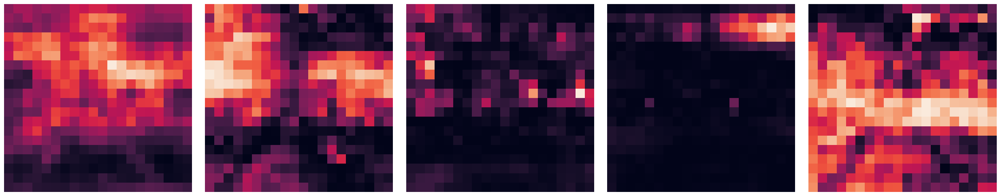

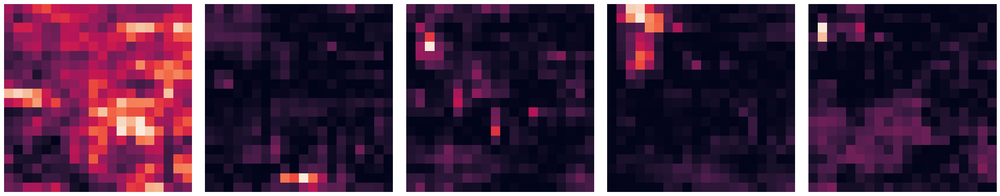

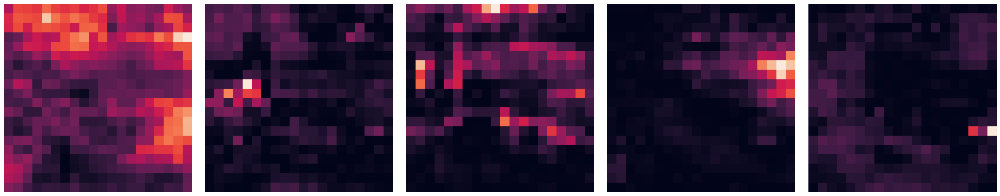

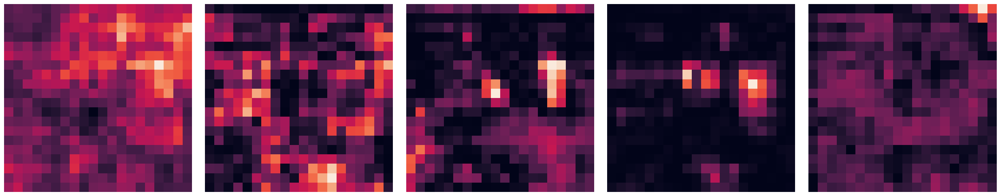

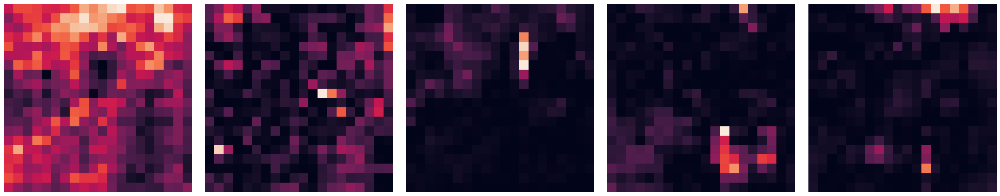

In [386]:
class LatentSpaceDataset(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.tensor_files = [f for f in os.listdir(root_dir) if f.endswith('.pt')]

    def __len__(self):
        return len(self.tensor_files)

    def __getitem__(self, idx):
        tensor_path = os.path.join(self.root_dir, self.tensor_files[idx])
        latent_tensor = torch.load(tensor_path)
        return latent_tensor
        
latent_dataset = LatentSpaceDataset(root_dir='latent_tensors')
train_latent_dataset, test_latent_dataset = random_split(latent_dataset, [0.8, 0.2])
train_latent_loader = DataLoader(train_latent_dataset, batch_size = 2, shuffle = True)
test_latent_loader = DataLoader(test_latent_dataset, batch_size = 2, shuffle = True)
      
anomaly_latent_dataset = LatentSpaceDataset(root_dir='anomaly_latent_tensors')
anomaly_latent_loader = DataLoader(anomaly_latent_dataset, batch_size=2, shuffle=True)
for i in range(5):
    T = next(iter(train_latent_loader))[0]
    T = T.view(-1, *T.shape).permute(1, 0, 2, 3)
    display_sample(T.detach().to('cpu'))

#### SAVE ANAMOLIES

#### TRAIN VAE WITH LATENT TENSORS

In [391]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vae = LatentVanillaVAE(kld_weight = 0.0001)
vae = vae.to(device)
optimizer = torch.optim.Adam(vae.parameters(), lr = 3e-4, amsgrad = True)
train_model(vae, 2000, optimizer, train_latent_loader, 2, 'yolo_vae', max_grad_norm = 3.0)



[Epoch:    1] loss: 0.0573 MSE: 0.0439 KLD: -11.9750 L1: 0.1228                     
[Epoch:    2] loss: 0.0526 MSE: 0.0405 KLD: -5.6971 L1: 0.1148                     
[Epoch:    3] loss: 0.0512 MSE: 0.0398 KLD: -1.9326 L1: 0.1122                     
[Epoch:    4] loss: 0.0506 MSE: 0.0395 KLD: -0.2335 L1: 0.1108                     
[Epoch:    5] loss: 0.0502 MSE: 0.0392 KLD: -0.1237 L1: 0.1099                     
[Epoch:    6] loss: 0.0501 MSE: 0.0391 KLD: -0.1147 L1: 0.1095                     
[Epoch:    7] loss: 0.0499 MSE: 0.0390 KLD: -0.1088 L1: 0.1091                     
[Epoch:    8] loss: 0.0499 MSE: 0.0390 KLD: -0.0967 L1: 0.1089                     
[Epoch:    9] loss: 0.0498 MSE: 0.0389 KLD: -0.0892 L1: 0.1089                     
[Epoch:   10] loss: 0.0497 MSE: 0.0389 KLD: -0.0825 L1: 0.1087                     
[Epoch:   11] loss: 0.0497 MSE: 0.0388 KLD: -0.0731 L1: 0.1086                     
[Epoch:   12] loss: 0.0500 MSE: 0.0391 KLD: -0.0889 L1: 0.1093             

In [395]:
next(iter(train_latent_loader))[0].shape

torch.Size([256, 20, 20])

#### INFERENCE

In [397]:
def compute_statistics(dataset, model):
    """
    Computes mean and sd of reconstruction losses of all images in a given dataset, using a given variational autoencoder.

    :param dataset : Dataset
    :param model : YOLOV8
    """
    L = []
    for T in dataset:
        T = T.view(-1, *T.shape).to(device)
        recon, images, mu, logvar = model(T)
        metrics = model.loss_function(recon, images, mu, logvar)
        L.append(metrics['loss'].detach().cpu().numpy())
    return np.mean(L), np.std(L)

def find_intersection(mu1,mu2,sigma1,sigma2):
    a = 1/(2*sigma1**2) - 1/(2*sigma2**2)
    b = mu2/(sigma2**2) - mu1/(sigma1**2)
    c = mu1**2 /(2*sigma1**2) - mu2**2 / (2*sigma2**2) - np.log(sigma2/sigma1)
    roots = np.roots([a,b,c])
    s, *_ = [r for r in roots if ((mu1 <= r <= mu2) or (mu1 <= r <= mu2))]
    return s
    
def compute_preds(dataset, threshold, model):
    """
    Makes the model predict outliers using the given threshold, on a dataset. 
    
    :param dataset : Dataset
    :param threshold : float
    :param model : YOLOV8
    """
    preds = []
    for T in dataset:
        T = T.view(-1, *T.shape).to(device)
        preds.append(model.check_if_outlier(T, threshold))
    preds = [*map(int, preds)] 
    return preds
            
def compute_metrics(metrics, inliers_dataset, outliers_dataset, threshold, model):
    """
    Computes metrics based on labels and predictions. 

    :param metrics : list
    :param inliers_dataset : Dataset
    :param outliers_dataset : Dataset
    :param threshold : float
    :param model : YOLOV8
    """
    preds_outliers = compute_preds(outliers_dataset, threshold, model)
    preds_inliers = compute_preds(inliers_dataset, threshold, model)
    labels = [0]*len(preds_inliers)+[1]*len(preds_outliers)
    
    preds = preds_inliers + preds_outliers
    results = {f.__name__ : f(labels, preds) for f in metrics}
    return results

def compute_loss(dataset, model):
    """
    Computes loss for every element in given dataset. 
    
    :param dataset : Dataset
    :param model : YOLOV8
    :return L : (list) Losses 
    """
    L = []
    for T in dataset:
        T = T.view(-1, *T.shape).to(device)
        recon, images, mu, logvar = model(T)
        metrics = vae.loss_function(recon, images, mu, logvar)
        L.append(metrics['loss'].detach().cpu().numpy())
    return L
    
latent_vae = LatentVanillaVAE(kld_weight = 0.0001)
latent_vae = latent_vae.to(device)
latent_vae.load_state_dict(torch.load('yolo_vae'))
model = latent_vae
mu1, sigma1 = compute_statistics(train_latent_dataset, model)
mu2, sigma2 = compute_statistics(anomaly_latent_dataset, model)
threshold = find_intersection(mu1,mu2,sigma1,sigma2)
metrics = [f1_score, accuracy_score]
inliers_dataset = test_latent_dataset
outliers_dataset = anomaly_latent_dataset


print(compute_metrics(metrics, inliers_dataset, outliers_dataset, threshold, model), sep = '\n')


{'f1_score': 0.9712732919254659, 'accuracy_score': 0.9496084439904665}


In [401]:
model = NonLatentVanillaVAE(kld_weight = 0.01)
model = model.to(device)
model.load_state_dict(torch.load('baseline_vae'))
model = model
metrics = [f1_score, accuracy_score]
mu1, sigma1 = compute_statistics(train_dataset, model)
mu2, sigma2 = compute_statistics(anomaly_dataset, model)
#threshold = find_intersection(mu1,mu2,sigma1,sigma2)
threshold = (mu1+mu2)/2
inliers_dataset = test_dataset
outliers_dataset = anomaly_dataset

print(compute_metrics(metrics, inliers_dataset, outliers_dataset, threshold, model), sep = '\n')


{'f1_score': 0.5915354330708661, 'accuracy_score': 0.4743508549715009}


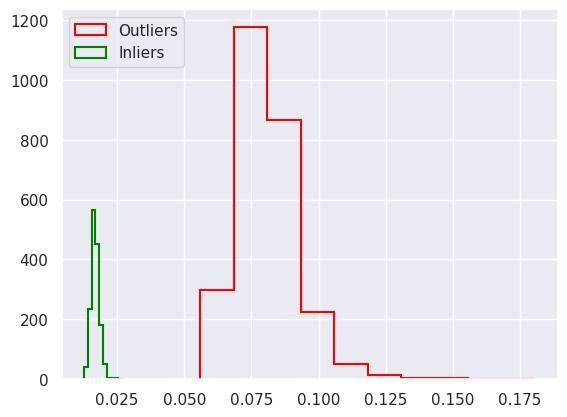

In [217]:
d1, d2 = compute_loss(sample_anomaly_folder, vae), compute_loss(sample_tensor_folder, vae)
fig, ax = plt.subplots()
ax.hist(d1, 10, None, ec='red', fc='none', lw=1.5, histtype='step', label='Outliers')
ax.hist(d2, 10, None, ec='green', fc='none', lw=1.5, histtype='step', label='Inliers')
ax.legend(loc='upper left')
plt.show()

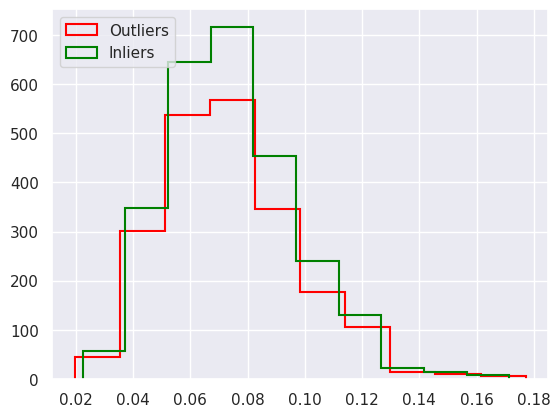

In [342]:
d1, d2 = compute_loss(train_dataset, model), compute_loss(anomaly_dataset, model)
fig, ax = plt.subplots()
ax.hist(d1, 10, None, ec='red', fc='none', lw=1.5, histtype='step', label='Outliers')
ax.hist(d2, 10, None, ec='green', fc='none', lw=1.5, histtype='step', label='Inliers')
ax.legend(loc='upper left')
plt.show()

### YOLO inference

In [4]:
import numpy as np
from ultralyticsplus import YOLO, render_result
import matplotlib.pyplot as plt
from PIL import Image 
%matplotlib inline
from IPython.display import display
import os
import torchvision.transforms as transforms
import torch

ROOT_DIR = "datasets"
model = YOLO("yolov8n.pt")  # load pre trained model
model.to('cuda')
# Use the model
results = model.train(data=os.path.join(ROOT_DIR, "yolov8_forklifts/forklift_config.yaml"), epochs=1)  # train the model

Ultralytics YOLOv8.0.21 🚀 Python-3.8.3 torch-2.0.0+cu117 CUDA:0 (Quadro RTX 8000, 48593MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=datasets/yolov8_forklifts/forklift_config.yaml, epochs=1, patience=50, batch=16, imgsz=640, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=F

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


optimizer: SGD(lr=0.01) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.001), 63 bias
train: Scanning /nfs/home/sidsom/datasets/yolov8_forklifts/images/train/labels.c
val: Scanning /nfs/home/sidsom/datasets/yolov8_forklifts/images/val/labels.cache
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train41
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
  0%|          | 0/165 [00:00<?, ?it/s]

My name is YOLO and I have a terrible github


        1/1      2.71G      1.614      3.737      1.336         88        640:  Exception in thread Thread-23:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 72, in run
    reraise(*_capture_exception())
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/_compat.py", line 115, in reraise
    raise value
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 70, in run
    return old_run_func(self, *a, **kw)
  File "/opt/anaconda3/lib/python3.8/threading.py", line 870, in run
    self._target(*self._args, **self._kwargs)
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/ultralytics/yolo/utils/plotting.py", line 251, in plot_images
    annotator.box_label(box, label, color=color)
  File "/nfs/home/sidsom/smir

My name is YOLO and I have a terrible github


        1/1      2.71G      1.618      3.654      1.314         79        640:  Exception in thread Thread-24:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 72, in run
    reraise(*_capture_exception())
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/_compat.py", line 115, in reraise
    raise value
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 70, in run
    return old_run_func(self, *a, **kw)
  File "/opt/anaconda3/lib/python3.8/threading.py", line 870, in run
    self._target(*self._args, **self._kwargs)
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/ultralytics/yolo/utils/plotting.py", line 251, in plot_images
    annotator.box_label(box, label, color=color)
  File "/nfs/home/sidsom/smir

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


Exception in thread Thread-25:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 72, in run
    reraise(*_capture_exception())
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/_compat.py", line 115, in reraise
    raise value
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 70, in run
    return old_run_func(self, *a, **kw)
  File "/opt/anaconda3/lib/python3.8/threading.py", line 870, in run
    self._target(*self._args, **self._kwargs)
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/ultralytics/yolo/utils/plotting.py", line 251, in plot_images
    annotator.box_label(box, label, color=color)
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/ultralytics/yolo/utils/plotting.py", line 63,

My name is YOLO and I have a terrible github


        1/1      2.72G      1.599       3.58      1.323         94        640:  

My name is YOLO and I have a terrible github


        1/1      2.72G      1.591      3.558      1.324         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.72G      1.578      3.542      1.327         80        640:  

My name is YOLO and I have a terrible github


        1/1      2.72G      1.581      3.546      1.339         79        640:  

My name is YOLO and I have a terrible github


        1/1      2.72G      1.573      3.535      1.332         97        640:  

My name is YOLO and I have a terrible github


        1/1      2.72G      1.567      3.528      1.327         87        640:  

My name is YOLO and I have a terrible github


        1/1      2.72G      1.569      3.527       1.33         84        640:  

My name is YOLO and I have a terrible github


        1/1      2.72G      1.566      3.524      1.336         77        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.72G       1.57      3.527      1.338         68        640:  

My name is YOLO and I have a terrible github


        1/1      2.72G      1.571      3.523      1.338         95        640:  

My name is YOLO and I have a terrible github


        1/1      2.72G      1.561      3.512      1.331         69        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.72G      1.553      3.502      1.321         96        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.72G      1.549      3.494       1.32         86        640:  

My name is YOLO and I have a terrible github


        1/1      2.72G       1.54      3.487      1.315         84        640:  

My name is YOLO and I have a terrible github


        1/1      2.72G      1.532      3.483      1.312         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.72G      1.525      3.472      1.309         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.72G      1.522      3.464      1.307         96        640:  

My name is YOLO and I have a terrible github


        1/1      2.72G       1.52       3.46      1.307         72        640:  

My name is YOLO and I have a terrible github


        1/1      2.72G      1.522      3.456      1.306         68        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.507       3.44      1.297         92        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.93G      1.493      3.426      1.289         74        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.93G      1.492      3.417      1.287         88        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.486      3.406      1.286         71        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.483      3.396      1.283        113        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.475      3.378      1.278         58        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.93G      1.471       3.36      1.275         95        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.93G       1.47      3.349      1.272         85        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.469      3.338      1.271         90        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.465      3.313      1.267         95        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.93G      1.463      3.289      1.264         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.93G       1.46      3.277      1.264         76        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.463      3.264      1.264         98        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.456      3.233       1.26         84        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.93G      1.454        3.2      1.259         76        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.93G      1.452      3.184      1.259         64        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.455      3.169      1.258         87        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.454      3.135      1.256         93        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.93G      1.456      3.104      1.254         92        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.93G      1.457      3.088      1.255         77        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.455       3.07      1.255         86        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.452      3.054      1.252         90        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.448      3.023      1.251         59        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.93G      1.445      2.992      1.248         71        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.93G      1.443      2.977      1.247         87        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.439      2.961      1.246         79        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.439      2.945      1.246         71        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.438      2.917      1.244         80        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.93G      1.434      2.885      1.241         88        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.93G      1.434      2.874      1.241         57        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.432      2.858       1.24         88        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.431      2.847      1.239         76        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.426      2.807      1.235         85        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.93G      1.425      2.793      1.234         91        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.424       2.78      1.233         77        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.422      2.767      1.232         81        640:  

My name is YOLO and I have a terrible github


        1/1      2.93G      1.421      2.753      1.231         83        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G      1.417      2.728       1.23         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.94G      1.415      2.703      1.228         81        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.94G      1.414      2.691      1.228         70        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G      1.412       2.68      1.227         72        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G      1.408      2.655      1.225         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.94G      1.409      2.635      1.225         92        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.94G      1.408      2.623      1.224         86        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G      1.405      2.611      1.223         59        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G      1.403      2.601      1.222         74        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G      1.398      2.568       1.22        104        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.94G      1.396      2.557      1.219         86        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G      1.393      2.546      1.217         73        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G      1.389      2.524      1.216         81        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G      1.386      2.508      1.214         59        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.94G      1.385      2.499      1.213        100        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G      1.384      2.488      1.213         87        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G       1.38      2.469      1.211         89        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G      1.379      2.452       1.21        115        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.94G      1.378      2.443      1.209         98        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G      1.376      2.435      1.208         88        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G      1.373      2.424      1.207         71        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G      1.371      2.416      1.206         89        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G      1.372      2.396      1.206         73        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.94G      1.372      2.388      1.205         90        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.94G      1.371       2.38      1.205         85        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G       1.37      2.373      1.205         77        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G      1.367      2.358      1.204         91        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.94G      1.365      2.336      1.203         76        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1      2.94G      1.364      2.328      1.202        109        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G      1.362      2.321      1.201         87        640:  

My name is YOLO and I have a terrible github


        1/1      2.94G       1.36      2.314      1.201         91        640:  

My name is YOLO and I have a terrible github


        1/1       3.2G      1.356      2.293      1.199         64        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1       3.2G      1.355      2.285      1.198         83        640:  

My name is YOLO and I have a terrible github


        1/1       3.2G      1.354      2.278      1.197         80        640:  

My name is YOLO and I have a terrible github


        1/1       3.2G      1.353      2.271      1.197         97        640:  

My name is YOLO and I have a terrible github


        1/1       3.2G      1.352      2.264      1.196        109        640:  

My name is YOLO and I have a terrible github


        1/1       3.2G       1.35      2.243      1.195         54        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1       3.2G       1.35      2.237      1.195         90        640:  

My name is YOLO and I have a terrible github


        1/1       3.2G       1.35      2.231      1.195         72        640:  

My name is YOLO and I have a terrible github


        1/1       3.2G      1.349      2.224      1.195         85        640:  

My name is YOLO and I have a terrible github


        1/1       3.2G      1.347      2.212      1.194         63        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1       3.2G      1.345        2.2      1.193         65        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1       3.2G      1.345      2.193      1.193         83        640:  

My name is YOLO and I have a terrible github


        1/1       3.2G      1.343      2.186      1.192         90        640:  

My name is YOLO and I have a terrible github


        1/1       3.2G      1.343       2.18      1.192         95        640:  

My name is YOLO and I have a terrible github


        1/1       3.2G      1.341      2.168      1.192         83        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1       3.2G      1.339      2.156       1.19         82        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1       3.2G      1.338       2.15      1.189         71        640:  

My name is YOLO and I have a terrible github


        1/1       3.2G      1.338      2.145      1.189        100        640:  

My name is YOLO and I have a terrible github


        1/1       3.2G      1.337      2.139      1.189         87        640:  

My name is YOLO and I have a terrible github


        1/1       3.2G      1.337      2.134      1.188         82        640:  

My name is YOLO and I have a terrible github


        1/1       3.2G      1.335      2.116      1.187         82        640:  

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


        1/1       3.2G      1.334      2.111      1.187         65        640:  

My name is YOLO and I have a terrible github


        1/1       3.2G      1.333      2.106      1.186         75        640:  

My name is YOLO and I have a terrible github


        1/1      3.21G      1.333      2.096      1.186         49        640: 1

My name is YOLO and I have a terrible github


        1/1      3.21G      1.333      2.096      1.186         49        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github


Exception in thread Thread-30:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 72, in run
    reraise(*_capture_exception())
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/_compat.py", line 115, in reraise
    raise value
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 70, in run
    return old_run_func(self, *a, **kw)
  File "/opt/anaconda3/lib/python3.8/threading.py", line 870, in run
Exception in thread Thread-27:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self._target(*self._args, **self._kwargs)
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/ultralytics/yolo/utils/plotting.py", line 251, in plot_images
Exception 

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        355        981      0.798      0.682      0.745      0.467
              forklift        355        518      0.786      0.772      0.807      0.576
                person        355        463      0.811      0.592      0.684      0.357

1 epochs completed in 0.014 hours.
Optimizer stripped from runs/detect/train41/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train41/weights/best.pt, 6.2MB

Validating runs/detect/train41/weights/best.pt...
Ultralytics YOLOv8.0.21 🚀 Python-3.8.3 torch-2.0.0+cu117 CUDA:0 (Quadro RTX 8000, 48593MiB)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  mException in thread Thread-35:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 72, in run
    reraise(*_capture_exception())
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/_compat.py", line 115, in reraise
    raise value
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 70, in run
    return old_run_func(self, *a, **kw)
  File "/opt/anaconda3/lib/python3.8/threading.py", line 870, in run
    self._target(*self._args, **self._kwargs)
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/ultralytics/yolo/utils/plotting.py", line 251, in plot_images
Exception in thread Thread-36:
Traceback (most recent call last):
  File "/opt

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  mException in thread Thread-37:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 72, in run
    reraise(*_capture_exception())
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/_compat.py", line 115, in reraise
    raise value
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 70, in run
    return old_run_func(self, *a, **kw)
  File "/opt/anaconda3/lib/python3.8/threading.py", line 870, in run
    self._target(*self._args, **self._kwargs)
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/ultralytics/yolo/utils/plotting.py", line 251, in plot_images
    annotator.box_label(box, label, color=color)
  File "/nfs/home/sidsom/smir

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  mException in thread Thread-39:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 72, in run
    reraise(*_capture_exception())
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/_compat.py", line 115, in reraise
    raise value
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/sentry_sdk/integrations/threading.py", line 70, in run
    return old_run_func(self, *a, **kw)
  File "/opt/anaconda3/lib/python3.8/threading.py", line 870, in run
    self._target(*self._args, **self._kwargs)
  File "/nfs/home/sidsom/smirk-env2/lib/python3.8/site-packages/ultralytics/yolo/utils/plotting.py", line 251, in plot_images
    annotator.box_label(box, label, color=color)
  File "/nfs/home/sidsom/smir

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m

My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


                 Class     Images  Instances      Box(P          R      mAP50  m


My name is YOLO and I have a terrible github


                   all        355        981      0.798      0.682      0.745      0.466
              forklift        355        518      0.787      0.772      0.807      0.575
                person        355        463      0.808      0.592      0.684      0.357
Speed: 0.4ms pre-process, 0.6ms inference, 0.0ms loss, 3.2ms post-process per image
Results saved to runs/detect/train41


In [29]:
def get_inference(model, filepath):
    image = Image.open(filepath)
    results = model(filepath)
    render = render_result(model=model, image=image, result=results[0])
    display(render)

In [27]:
import random
folder = "datasets/yolov8_forklifts/images/train/images"
images_only = [path for path in os.listdir(folder) if path[0] == 'p']
paths = random.sample(images_only, 5)

In [30]:
path = "datasets/yolov8_forklifts/images/train/images/p1_10320_jpg.rf.9d32167569a923813078393c47a58406.jpg"

Ultralytics YOLOv8.0.21 🚀 Python-3.8.3 torch-2.0.0+cu117 CUDA:0 (Quadro RTX 8000, 48593MiB)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs
image 1/1 /nfs/home/sidsom/datasets/yolov8_forklifts/images/train/images/p2_26520_jpg.rf.d0dda6af4ac701e07eb3ad1832ae3f69.jpg: 384x640 10.3ms
Speed: 0.3ms pre-process, 10.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github
My name is YOLO and I have a terrible github


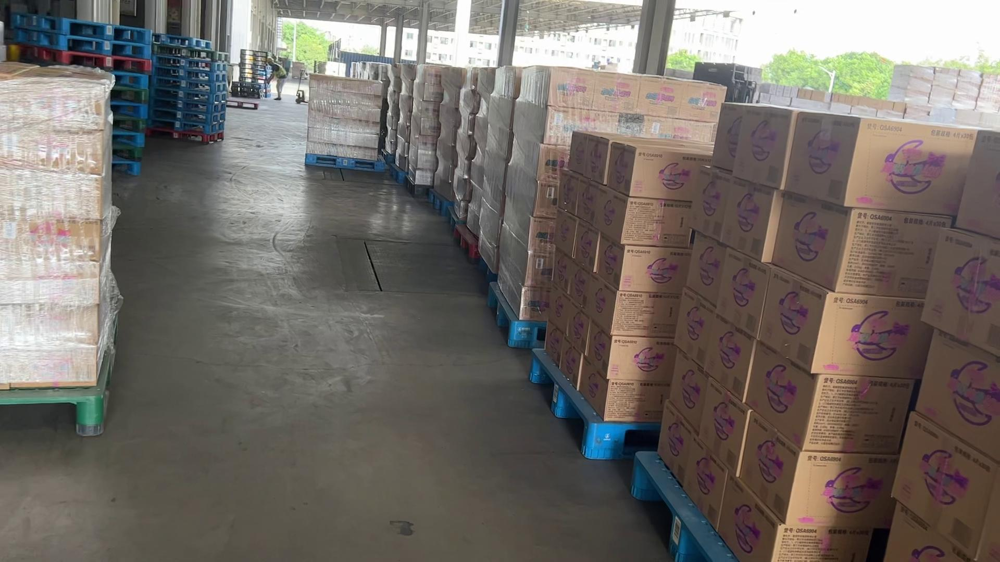

image 1/1 /nfs/home/sidsom/datasets/yolov8_forklifts/images/train/images/p1_16320_jpg.rf.9af60ec7b8b19de8a6587ce148af03a6.jpg: 384x640 1 forklift, 1 person, 6.4ms
Speed: 4.0ms pre-process, 6.4ms inference, 58.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


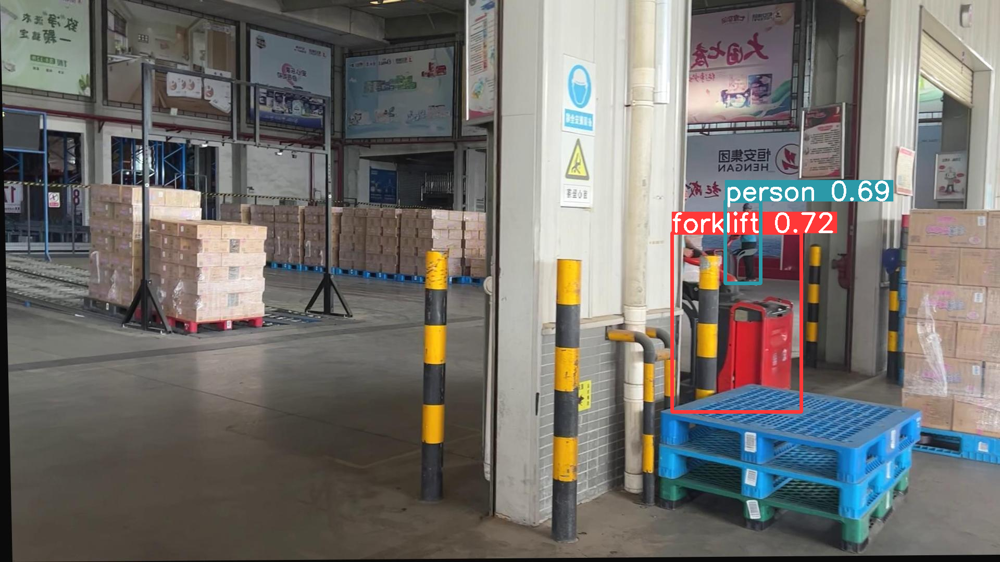

image 1/1 /nfs/home/sidsom/datasets/yolov8_forklifts/images/train/images/p1_13290_jpg.rf.6c9da2a4b911d448b6052cfb5aff1165.jpg: 384x640 1 forklift, 3 persons, 6.3ms
Speed: 1.5ms pre-process, 6.3ms inference, 58.8ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


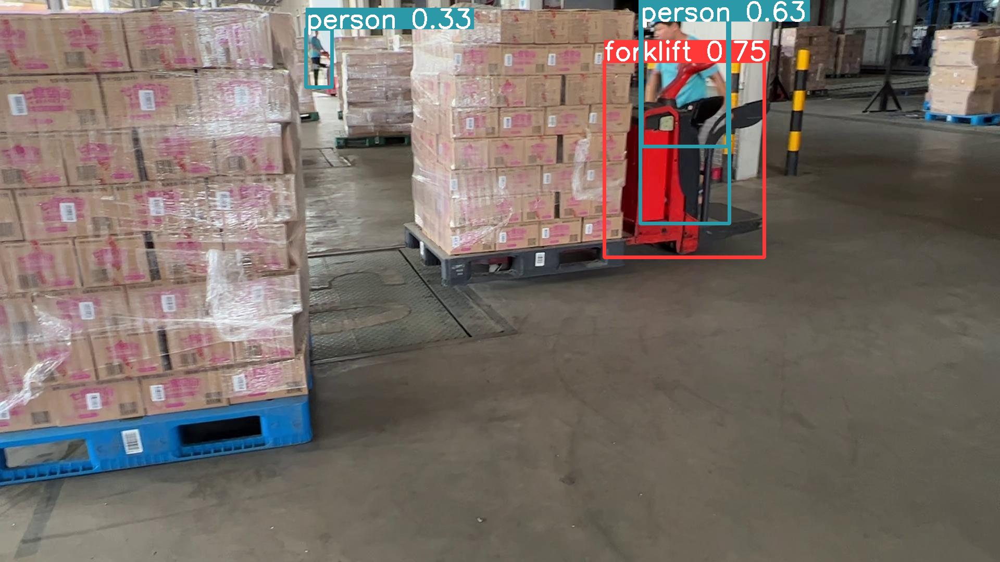

image 1/1 /nfs/home/sidsom/datasets/yolov8_forklifts/images/train/images/p1_34680_jpg.rf.3618769b08fbbe24ba613b792d700ed2.jpg: 384x640 1 forklift, 1 person, 6.4ms
Speed: 2.2ms pre-process, 6.4ms inference, 52.1ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


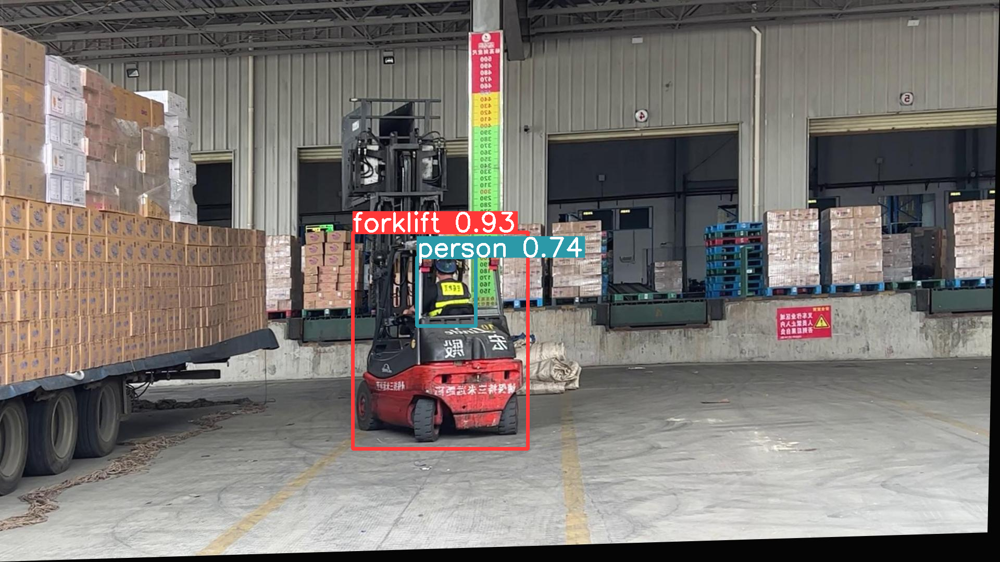

image 1/1 /nfs/home/sidsom/datasets/yolov8_forklifts/images/train/images/p1_6570_jpg.rf.0210f9a6e89fde2fa957cbc69f4540a5.jpg: 384x640 2 forklifts, 2 persons, 5.4ms
Speed: 0.4ms pre-process, 5.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


My name is YOLO and I have a terrible github


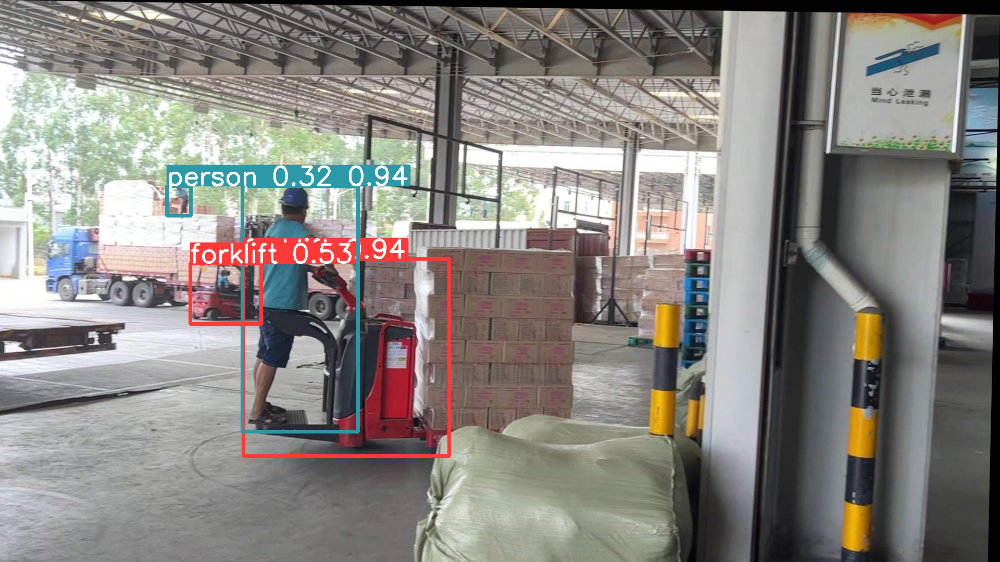

In [32]:
for path in paths:
    get_inference(trained_yolo, os.path.join(folder, path))

In [9]:
image = Image.open(path)
display(image)